# DBM Mask R-CNN Code

*Upload the unzipped version of the DBM Mask RCNN folder into your Google Drive's "My Drive" before running the code for the first time, or if any of the files inside the folder has been updated*

In [ ]:
!pip uninstall keras-nightly
!pip install h5py==2.10.0

Found existing installation: keras-nightly 2.5.0.dev2021032900
Uninstalling keras-nightly-2.5.0.dev2021032900:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/keras/*
    /usr/local/lib/python3.7/dist-packages/keras_nightly-2.5.0.dev2021032900.dist-info/*
  Would not remove (might be manually added):
    /usr/local/lib/python3.7/dist-packages/keras/applications/resnet50.py
    /usr/local/lib/python3.7/dist-packages/keras/engine/network.py
    /usr/local/lib/python3.7/dist-packages/keras/engine/topology.py
    /usr/local/lib/python3.7/dist-packages/keras/initializers.py
    /usr/local/lib/python3.7/dist-packages/keras/layers/experimental/__init__.py
    /usr/local/lib/python3.7/dist-packages/keras/layers/experimental/preprocessing/__init__.py
    /usr/local/lib/python3.7/dist-packages/keras/objectives.py
    /usr/local/lib/python3.7/dist-packages/keras/optimizers/__init__.py
    /usr/local/lib/python3.7/dist-packages/keras/optimizers/schedules/__init__.py
    /usr/local/lib/p

### Importing the required libraries for Weights & Biases integration and for Mask R-CNN code

In [ ]:
import os
import numpy as np
!pip install tensorflow==1.15.0rc2
import tensorflow as tf
!pip install keras==2.2.5

     |████████████████████████████████| 412.3 MB 27 kB/s 
     |████████████████████████████████| 3.8 MB 39.9 MB/s 
     |████████████████████████████████| 503 kB 56.9 MB/s 
     |████████████████████████████████| 50 kB 7.8 MB/s 
  Created wheel for gast: filename=gast-0.2.2-py3-none-any.whl size=7553 sha256=24626836f2ce457cc9b8d2ccd54cb08cf0063c65692afc4ba811b05a4981b9bc
  Stored in directory: /root/.cache/pip/wheels/21/7f/02/420f32a803f7d0967b48dd823da3f558c5166991bfd204eef3
Successfully built gast
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.5.0
    Uninstalling tensorflow-estimator-2.5.0:
      Successfully uninstalled tensorflow-estimator-2.5.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.5.0
    Uninstalling tensorboard-2.5.0:
      Successfully uninstalled tensorboard-2.5.0
  Attempting uninstall: gast
    Found existing installation: gast 0.4.0
    Uninstalling gast-0.4.0:
      Succes

### Mounting drive to upload files from Google Drive

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


### Uploading DBM dataset file (with images and XML files) and visualize, utils & model Python files

In [ ]:
#!unzip "/gdrive/My Drive/DBM Mask RCNN/resizedDBM.zip"
#!unzip "/gdrive/My Drive/DBM Mask RCNN/DBM.zip"
!unzip "//gdrive//My Drive//DBM Mask RCNN//split in 4 ordered.zip"
!cp "/gdrive/My Drive/DBM Mask RCNN/visualize_saveimage_orderedfilename.py" "visualize.py"
!cp "/gdrive/My Drive/DBM Mask RCNN/utils.py" "utils.py"
!cp "/gdrive/My Drive/DBM Mask RCNN/model_savetodrive.py" "model.py"

Streaming output truncated to the last 5000 lines.
  inflating: split in 4 ordered/annots/1813.xml  
  inflating: split in 4 ordered/annots/1814.xml  
  inflating: split in 4 ordered/annots/1815.xml  
  inflating: split in 4 ordered/annots/1816.xml  
  inflating: split in 4 ordered/annots/1817.xml  
  inflating: split in 4 ordered/annots/1818.xml  
  inflating: split in 4 ordered/annots/1819.xml  
  inflating: split in 4 ordered/annots/182.xml  
  inflating: split in 4 ordered/annots/1820.xml  
  inflating: split in 4 ordered/annots/1821.xml  
  inflating: split in 4 ordered/annots/1822.xml  
  inflating: split in 4 ordered/annots/1823.xml  
  inflating: split in 4 ordered/annots/1824.xml  
  inflating: split in 4 ordered/annots/1825.xml  
  inflating: split in 4 ordered/annots/1826.xml  
  inflating: split in 4 ordered/annots/1827.xml  
  inflating: split in 4 ordered/annots/1828.xml  
  inflating: split in 4 ordered/annots/1829.xml  
  inflating: split in 4 ordered/annots/183.xml  
 

### Importing the required libraries for Mask R-CNN code

In [ ]:
import xml.etree
from numpy import zeros, asarray
from random import sample

!pip install mrcnn
import mrcnn
import mrcnn.config
import visualize
import utils
import model

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array

     |████████████████████████████████| 51 kB 292 kB/s 
  Created wheel for mrcnn: filename=mrcnn-0.2-py3-none-any.whl size=54931 sha256=45b8c8545d3b1a35916e96f0e20e79d38f79a3a25ae406fbee10f2d02d97e676
  Stored in directory: /root/.cache/pip/wheels/1d/94/0d/03ff96abc43d2d6c8299a92cbb4eced2a1eda3ca7911c19427
Successfully built mrcnn


Using TensorFlow backend.


### DBM Configuration

In [ ]:
class DBMConfig(mrcnn.config.Config): 
    NAME = "DBM_cfg"

    BACKBONE = "resnet50"

    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    
    NUM_CLASSES = 2 #(background/non-DBM + DBM)

    STEPS_PER_EPOCH = 2952

    PRE_NMS_LIMIT = 6000

    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)
    BACKBONE_STRIDES = [4, 8, 16, 32, 64]
    IMAGE_MAX_DIM = 1024
    IMAGE_MIN_DIM = 1024

    DETECTION_MAX_INSTANCES = 1000

DBM_config = DBMConfig()
DBM_config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        1000
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  1024
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INST

### DBM Dataset

In [ ]:
randimage_id = []
file = open("/gdrive/My Drive/DBM Mask RCNN/test_set_images_651f06a7-c56a-49a2-8ba7-25be2ad1dba4.txt", "r")
file_lines = file.read()
file_lines = file_lines.rstrip("\n")
array = file_lines.split("\n")
for num in array:
  randimage_id.append((4 * int(num)) - 3)
  randimage_id.append((4 * int(num)) - 2)
  randimage_id.append((4 * int(num)) - 1)
  randimage_id.append((4 * int(num)))
print(randimage_id)

[2069, 2070, 2071, 2072, 1093, 1094, 1095, 1096, 1269, 1270, 1271, 1272, 1905, 1906, 1907, 1908, 1753, 1754, 1755, 1756, 2853, 2854, 2855, 2856, 2005, 2006, 2007, 2008, 949, 950, 951, 952, 1421, 1422, 1423, 1424, 773, 774, 775, 776, 2629, 2630, 2631, 2632, 2053, 2054, 2055, 2056, 1533, 1534, 1535, 1536, 2549, 2550, 2551, 2552, 873, 874, 875, 876, 101, 102, 103, 104, 2489, 2490, 2491, 2492, 1745, 1746, 1747, 1748, 2689, 2690, 2691, 2692, 2833, 2834, 2835, 2836, 2477, 2478, 2479, 2480, 1137, 1138, 1139, 1140, 1705, 1706, 1707, 1708, 897, 898, 899, 900, 2121, 2122, 2123, 2124, 2473, 2474, 2475, 2476, 1493, 1494, 1495, 1496, 2721, 2722, 2723, 2724, 2273, 2274, 2275, 2276, 541, 542, 543, 544, 425, 426, 427, 428, 2921, 2922, 2923, 2924, 617, 618, 619, 620, 1953, 1954, 1955, 1956, 153, 154, 155, 156, 1517, 1518, 1519, 1520, 877, 878, 879, 880, 905, 906, 907, 908, 449, 450, 451, 452, 17, 18, 19, 20, 509, 510, 511, 512, 2037, 2038, 2039, 2040, 2393, 2394, 2395, 2396, 2653, 2654, 2655, 2656, 234

In [ ]:
class DBMDataset(utils.Dataset):
  
  def load_dataset(self, dataset_dir, is_train = True):
    self.add_class("dataset", 1, "DBM")
    
    images_dir = dataset_dir + '/images/'
    annotations_dir = dataset_dir + '/annots/'
    
    for filename in os.listdir(images_dir):
      image_id = filename.split('.')[0] # removes .jpg from the name of the file

      # skip all 80 randomly choosen images if we are building the train set
      # allow all the other images to be in the train set
      if is_train and int(image_id) in randimage_id:
        continue

      # allow all 80 randomly choosen images if we are building the train set,
      # skip all the other images to be in the training set
      if not is_train and int(image_id) not in randimage_id:
        continue
      
      img_path = images_dir + filename
      ann_path = annotations_dir + image_id + '.xml'
      
      self.add_image('dataset', image_id = image_id, path = img_path, annotation = ann_path)

  def extract_boxes(self, filename):
    tree = xml.etree.ElementTree.parse(filename)
    root = tree.getroot()
    
    boxes = list()
    for box in root.findall('.//bndbox'):
      xmin = int(box.find('xmin').text)
      ymin = int(box.find('ymin').text)
      xmax = int(box.find('xmax').text)
      ymax = int(box.find('ymax').text)
      coors = [xmin, ymin, xmax, ymax]
      boxes.append(coors)
    
    width = int(root.find('.//size/width').text)
    height = int(root.find('.//size/height').text)
    return boxes, width, height
    
  def load_mask(self, image_id):
    info = self.image_info[image_id]
    path = info['annotation']
    boxes, w, h = self.extract_boxes(path)
    masks = zeros([h, w, len(boxes)], dtype = 'uint8')

    class_ids = list()
    for i in range(len(boxes)):
      box = boxes[i]
      row_s, row_e = box[1], box[3]
      col_s, col_e = box[0], box[2]
      masks[row_s:row_e, col_s:col_e, i] = 1
      class_ids.append(self.class_names.index('DBM'))
    return masks, asarray(class_ids, dtype = 'int32')

### Prepare training and validation sets

In [ ]:
train_set = DBMDataset()
train_set.load_dataset(dataset_dir = 'split in 4 ordered', is_train = True)
train_set.prepare()

valid_dataset = DBMDataset()
valid_dataset.load_dataset(dataset_dir = 'split in 4 ordered', is_train = False)
valid_dataset.prepare()

### Loading the model

In [ ]:
DBM_model = model.MaskRCNN(mode = "inference", config = DBM_config, model_dir = './')




Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead

Instructions for updating:
Use `tf.cast` instead.


In [ ]:
DBM_model.load_weights(filepath = '/gdrive/My Drive/DBM Mask RCNN/Config Files/dbm_cfg20210609T1659/mask_rcnn_dbm_cfg_0063.h5', 
                       by_name = True)

Re-starting from epoch 63


In [ ]:
#os.makedirs('/gdrive/My Drive/DBM Mask RCNN/DBM Model Results/change this name')

### Displaying and saving all the results into DBM Model Results folder (inside DBM Mask RCNN folder), and calculating mAP

In [ ]:
id_list = []
image_id = 0

for image_id in valid_dataset.image_ids:
  #image, image_meta, gt_class_id, gt_bbox, gt_mask = model.load_image_gt(valid_dataset, DBM_config, image_id, use_mini_mask=False)
  info = valid_dataset.image_info[image_id]
  #print(info["id"])
  id_list.append(int(info["id"]))

id_list.sort()
print(id_list)
id_list_split_group = [id_list[x:x+4] for x in range(0, len(id_list), 4)]
print(id_list_split_group)

[5, 6, 7, 8, 17, 18, 19, 20, 57, 58, 59, 60, 73, 74, 75, 76, 77, 78, 79, 80, 85, 86, 87, 88, 101, 102, 103, 104, 113, 114, 115, 116, 117, 118, 119, 120, 129, 130, 131, 132, 149, 150, 151, 152, 153, 154, 155, 156, 237, 238, 239, 240, 245, 246, 247, 248, 249, 250, 251, 252, 277, 278, 279, 280, 333, 334, 335, 336, 337, 338, 339, 340, 361, 362, 363, 364, 377, 378, 379, 380, 381, 382, 383, 384, 393, 394, 395, 396, 397, 398, 399, 400, 405, 406, 407, 408, 417, 418, 419, 420, 425, 426, 427, 428, 437, 438, 439, 440, 449, 450, 451, 452, 481, 482, 483, 484, 497, 498, 499, 500, 509, 510, 511, 512, 541, 542, 543, 544, 545, 546, 547, 548, 569, 570, 571, 572, 597, 598, 599, 600, 601, 602, 603, 604, 617, 618, 619, 620, 621, 622, 623, 624, 633, 634, 635, 636, 637, 638, 639, 640, 649, 650, 651, 652, 661, 662, 663, 664, 669, 670, 671, 672, 681, 682, 683, 684, 689, 690, 691, 692, 697, 698, 699, 700, 729, 730, 731, 732, 757, 758, 759, 760, 769, 770, 771, 772, 773, 774, 775, 776, 781, 782, 783, 784, 785, 78

In [ ]:
image_id = 0
id_dict = {}

for image_id in valid_dataset.image_ids:
  info = valid_dataset.image_info[image_id]
  id_dict.update({int(info["id"]):image_id})

print(id_dict)

{1922: 0, 758: 1, 690: 2, 542: 3, 903: 4, 2122: 5, 1097: 6, 119: 7, 889: 8, 973: 9, 1356: 10, 1786: 11, 2932: 12, 2723: 13, 681: 14, 1539: 15, 2104: 16, 822: 17, 239: 18, 113: 19, 976: 20, 692: 21, 247: 22, 663: 23, 2742: 24, 2855: 25, 394: 26, 1299: 27, 683: 28, 407: 29, 634: 30, 2332: 31, 619: 32, 1696: 33, 2930: 34, 1970: 35, 1746: 36, 1917: 37, 974: 38, 1368: 39, 2297: 40, 621: 41, 2465: 42, 2045: 43, 1166: 44, 700: 45, 2066: 46, 155: 47, 698: 48, 785: 49, 2018: 50, 153: 51, 2435: 52, 1167: 53, 672: 54, 2467: 55, 2748: 56, 2861: 57, 2833: 58, 2468: 59, 1020: 60, 1819: 61, 1552: 62, 1615: 63, 1569: 64, 2418: 65, 2700: 66, 2040: 67, 875: 68, 2165: 69, 1017: 70, 1583: 71, 1720: 72, 1921: 73, 1062: 74, 1584: 75, 2173: 76, 2629: 77, 662: 78, 2641: 79, 1195: 80, 1269: 81, 1550: 82, 546: 83, 1787: 84, 363: 85, 544: 86, 1646: 87, 2335: 88, 238: 89, 1495: 90, 2005: 91, 1044: 92, 617: 93, 2429: 94, 74: 95, 868: 96, 1993: 97, 2553: 98, 20: 99, 2037: 100, 58: 101, 2008: 102, 2921: 103, 2730: 1

In [ ]:
def compute_ap(gt_match, pred_match):
  """Compute Average Precision at a set IoU threshold (default 0.5).

  Returns:
  mAP: Mean Average Precision
  precisions: List of precisions at different class score thresholds.
  recalls: List of recall values at different class score thresholds.
  overlaps: [pred_boxes, gt_boxes] IoU overlaps.
  """

  # Compute precision and recall at each prediction box step
  precisions = np.cumsum(pred_match > -1) / (np.arange(len(pred_match)) + 1)
  recalls = np.cumsum(pred_match > -1).astype(np.float32) / len(gt_match)

  # Pad with start and end values to simplify the math
  precisions = np.concatenate([[0], precisions, [0]])
  recalls = np.concatenate([[0], recalls, [1]])

  # Ensure precision values decrease but don't increase. This way, the
  # precision value at each recall threshold is the maximum it can be
  # for all following recall thresholds, as specified by the VOC paper.
  for i in range(len(precisions) - 2, -1, -1):
    precisions[i] = np.maximum(precisions[i], precisions[i + 1])

  # Compute mean AP over recall range
  indices = np.where(recalls[:-1] != recalls[1:])[0] + 1
  mAP = np.sum((recalls[indices] - recalls[indices - 1]) *
                precisions[indices])

  return mAP, precisions, recalls

In [ ]:
image_id = 0
APs = []
mPrecision = []
mRecall = []

TPs = 0
FPs = 0
FNs = 0
FP_no_DBMs = 0
relativeTPs = []
relativeFPs = []
relativeFNs = []

total_images = 0
total_images_noGT = 0

total_FP_no_DBM = 0

list_accuracy = []

for group in id_list_split_group:
  #print(group)

  group_gt_match = np.empty([0], int)
  group_pred_match = np.empty([0], int)

  FP_no_DBM = 0

  count_group_gt_bbox = 0
  count_group_pred_bbox = 0

  for info_id in group:
    #print(info_id)
    image_id = id_dict.get(info_id)
    #print(image_id)
    image, image_meta, gt_class_id, gt_bbox, gt_mask = model.load_image_gt(valid_dataset, DBM_config, image_id, use_mini_mask=False)

    #print("===================================================================================================================")
    print("image_id: ", image_id)
    info = valid_dataset.image_info[image_id]
    results = DBM_model.detect([image], verbose=0)
    r = results[0]

    count_group_gt_bbox += len(gt_bbox)
    count_group_pred_bbox += len(r['rois'])

    if len(gt_bbox) != 0:
      '''
      visualize.display_differences(image, gt_bbox, gt_class_id, gt_mask, 
                                    r['rois'], r['class_ids'], r['scores'], r['masks'], 
                                    valid_dataset.class_names, title=str(info["id"]), 
                                    ax=None, show_mask=False, show_box=True, 
                                    iou_threshold=0.5, score_threshold=0.5, save_image = False, 
                                    filename = (str(int(group[3]/4)) + " (" + str(group.index(info_id) + 1) + ")")) #uncomment above cell if save_image = True
      '''
      gt_match, pred_match, overlaps = utils.compute_matches(gt_bbox, gt_class_id, gt_mask, 
                                                            r['rois'], r['class_ids'], r['scores'], r['masks'], 
                                                            iou_threshold=0.5)

      #print(gt_match)
      #print(pred_match)

      for num in gt_match:
        if num > -1:
          while num in group_gt_match:
            num += 1
        group_gt_match = np.append(group_gt_match, num)

      for num in pred_match:
        if num > -1:
          while num in group_pred_match:
            num += 1
        group_pred_match = np.append(group_pred_match, num)

      #print(group_gt_match)
      #print(group_pred_match)

      TP = np.sum(pred_match > -1)
      #print("TP: ", TP)
      TPs += TP

      FP = np.sum(pred_match == -1)
      #print("FP: ", FP)
      FPs += FP

      FN = len(gt_match) - np.sum(pred_match > -1)
      #print("FN: ", FN)
      FNs += FN

    else:
      #print("No DBMs present in image %s" % str(image_id))
      #total_images_noGT += 1
      #print("image_id: ", image_id)

      '''
      visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                  valid_dataset.class_names, r['scores'], 
                                  title=str(info["id"]), show_mask = False, save_image = False, 
                                  filename = (str(int(group[3]/4)) + " (" + str(group.index(info_id) + 1) + ")"))
      '''

      FP_no_DBM += len(r['rois'])
      #print("FP no DBM: ", len(r['rois']))
      #total_FP_no_DBM += FP_no_DBM

      for x in range(0, len(r['rois'])):
        group_pred_match = np.append(group_pred_match, -1)

  #print(group_gt_bbox)
  #print(len(group_gt_bbox))
  if len(group_gt_match) != 0:

    '''
    gt_match, pred_match, overlaps =\
        utils.compute_matches(group_gt_bbox, group_gt_class_id, group_gt_mask, group_rois, group_ids, group_scores, group_masks, iou_threshold=0.5)

    print(gt_match)
    print(pred_match)

    AP, precisions, recalls, overlaps =\
        utils.compute_ap(group_gt_bbox, group_gt_class_id, group_gt_mask, group_rois, group_ids, group_scores, group_masks, iou_threshold=0.5)
    '''
    #print(group_gt_match)
    #print(group_pred_match)

    AP, precisions, recalls = compute_ap(group_gt_match, group_pred_match)

    APs.append(AP)
    #print("AP: ", AP)
    #print("APs: ", APs)
    #print("precisions: ", precisions)
    #print("recalls: ", recalls)
    #print("precision value: ", precisions[-2])
    mPrecision.append(precisions[-2])
    #print("recall value: ", recalls[-2])
    mRecall.append(recalls[-2])

    #recall, positive_ids = utils.compute_recall(group_rois, group_gt_mask, 0.5)
    #print("recall value: ", recall)
    #mRecall.append(recall)

    #print("mAP: ", np.mean(APs))
    #print("Mean Precision: ", np.mean(mPrecision))
    #print("mAR: ", np.mean(mRecall))

    FPs += FP_no_DBM
    
    TP = np.sum(group_pred_match > -1)
    FP = np.sum(group_pred_match == -1)
    FN = len(group_gt_match) - np.sum(group_pred_match > -1)

    dict_accuracy = {
      "image_id": group[3]/4,
      "AP": AP,
      "Precision": precisions[-2],
      "Recall": recalls[-2],
      "TP": TP,
      "FP": FP,
      "FN": FN,
      "GT": count_group_gt_bbox
    }

    list_accuracy.append(dict_accuracy)

  else:

    dict_accuracy = {
      "image_id": group[3]/4,
      "TP": 0,
      "FP": count_group_pred_bbox,
      "GT": 0
    }

    list_accuracy.append(dict_accuracy)

    #print("FP no DBM for all 4 images: ", FP_no_DBM)
    total_FP_no_DBM += FP_no_DBM
    total_images_noGT += 1

image_id:  860
image_id:  396
image_id:  160
image_id:  547
image_id:  147
image_id:  641
image_id:  657
image_id:  99
image_id:  515
image_id:  101
image_id:  333
image_id:  265
image_id:  825
image_id:  95
image_id:  350
image_id:  193
image_id:  542
image_id:  258
image_id:  156
image_id:  881
image_id:  618
image_id:  748
image_id:  741
image_id:  152
image_id:  821
image_id:  438
image_id:  598
image_id:  203
image_id:  19
image_id:  411
image_id:  796
image_id:  433
image_id:  801
image_id:  791
image_id:  7
image_id:  696
image_id:  161
image_id:  526
image_id:  388
image_id:  283
image_id:  279
image_id:  824
image_id:  813
image_id:  131
image_id:  51
image_id:  167
image_id:  47
image_id:  717
image_id:  179
image_id:  89
image_id:  18
image_id:  772
image_id:  667
image_id:  385
image_id:  22
image_id:  157
image_id:  753
image_id:  868
image_id:  109
image_id:  712
image_id:  734
image_id:  812
image_id:  535
image_id:  480
image_id:  543
image_id:  192
image_id:  175
image

In [ ]:
print("mAP: ", np.mean(APs))
print("Mean Precision: ", np.mean(mPrecision))
print("mAR: ", np.mean(mRecall))

print("Total TP: ", TPs)
print("Total FP: ", FPs)
print("Total FN: ", FNs)

#print("Average Relative TP: ", np.mean(relativeTPs))
#print("Average Relative FP: ", np.mean(relativeFPs))
#print("Average Relative FN: ", np.mean(relativeFNs))

print("Total FP no DBM: ", total_FP_no_DBM)
print("Total num of images with no DBMs: ", total_images_noGT)
total_FP_combined = FPs + total_FP_no_DBM
print("Total Combined FP: ", total_FP_combined)

mAP:  0.7496561767386648
Mean Precision:  0.7823559614082368
mAR:  0.8250326488855159
Total TP:  1735
Total FP:  276
Total FN:  1874
Total FP no DBM:  105
Total num of images with no DBMs:  64
Total Combined FP:  381


In [ ]:
print(list_accuracy)

[{'image_id': 2.0, 'AP': 0.800000011920929, 'Precision': 1.0, 'Recall': 0.800000011920929, 'TP': 4, 'FP': 0, 'FN': 1, 'GT': 5}, {'image_id': 5.0, 'AP': 1.0, 'Precision': 1.0, 'Recall': 1.0, 'TP': 1, 'FP': 0, 'FN': 0, 'GT': 1}, {'image_id': 15.0, 'TP': 0, 'FP': 2, 'GT': 0}, {'image_id': 19.0, 'AP': 0.8448450306073995, 'Precision': 0.9464285714285714, 'Recall': 0.8548387289047241, 'TP': 53, 'FP': 3, 'FN': 9, 'GT': 62}, {'image_id': 20.0, 'AP': 0.8541666666666666, 'Precision': 0.5714285714285714, 'Recall': 1.0, 'TP': 4, 'FP': 3, 'FN': 0, 'GT': 4}, {'image_id': 22.0, 'AP': 0.0, 'Precision': 0.0, 'Recall': 0.0, 'TP': 0, 'FP': 0, 'FN': 1, 'GT': 1}, {'image_id': 26.0, 'AP': 1.0, 'Precision': 1.0, 'Recall': 1.0, 'TP': 2, 'FP': 0, 'FN': 0, 'GT': 2}, {'image_id': 29.0, 'AP': 1.0, 'Precision': 1.0, 'Recall': 1.0, 'TP': 2, 'FP': 0, 'FN': 0, 'GT': 2}, {'image_id': 30.0, 'AP': 0.7272727489471436, 'Precision': 1.0, 'Recall': 0.7272727489471436, 'TP': 8, 'FP': 0, 'FN': 3, 'GT': 11}, {'image_id': 33.0,

In [ ]:
more_than_37_correct = 0
more_than_37_wrong = 0
less_than_38_correct = 0
less_than_38_wrong = 0
more_than_37_wrong_list = []
less_than_38_wrong_list = []
deviation_more_than_37_list = []
deviation_less_than_38_list = []

for dicts in list_accuracy:
  if dicts['GT'] > 37:
    deviation_more_than_37_list.append((dicts['TP'] + dicts['FP']) - dicts['GT'])
    if (dicts['TP'] + dicts['FP']) > 37:
      more_than_37_correct += 1
    else:
      more_than_37_wrong += 1
      more_than_37_wrong_list.append("GTs:" + str(dicts['GT']) + "/" + "Preds:" + str(dicts['TP'] + dicts['FP']))
      print("Wrong 38 or more DBMs:", dicts['image_id'])
  
  else:
    deviation_less_than_38_list.append((dicts['TP'] + dicts['FP']) - dicts['GT'])
    if (dicts['TP'] + dicts['FP']) < 38:
      less_than_38_correct += 1
    else:
      less_than_38_wrong += 1
      less_than_38_wrong_list.append("GTs:" + str(dicts['GT']) + "/" + "Preds:" + str(dicts['TP'] + dicts['FP']))
      print("Wrong less than 38 DBMs:", dicts['image_id'])

print("\nTotal num of images with 38 or more DBMs:", more_than_37_correct + more_than_37_wrong)
print("Correctly identified:", more_than_37_correct)
print("Wrongly identified:", more_than_37_wrong, more_than_37_wrong_list)

print("Mean deviation:", np.mean(deviation_more_than_37_list))
print("Maximum deviation:", max(deviation_more_than_37_list))
print("Minimum deviation:", min(deviation_more_than_37_list))
print("Standard deviation:", np.std(deviation_more_than_37_list))


print("\nTotal num of images with less than 38 DBMs:", less_than_38_correct + less_than_38_wrong)
print("Correctly identified:", less_than_38_correct)
print("Wrongly identified:", less_than_38_wrong, less_than_38_wrong_list)

print("Mean deviation:", np.mean(deviation_less_than_38_list))
print("Maximum deviation:", max(deviation_less_than_38_list))
print("Minimum deviation:", min(deviation_less_than_38_list))
print("Standard deviation:", np.std(deviation_less_than_38_list))

Wrong 38 or more DBMs: 70.0
Wrong 38 or more DBMs: 84.0
Wrong 38 or more DBMs: 257.0
Wrong 38 or more DBMs: 289.0
Wrong less than 38 DBMs: 338.0
Wrong 38 or more DBMs: 430.0
Wrong 38 or more DBMs: 493.0

Total num of images with 38 or more DBMs: 20
Correctly identified: 14
Wrongly identified: 6 ['GTs:316/Preds:20', 'GTs:44/Preds:25', 'GTs:105/Preds:32', 'GTs:205/Preds:25', 'GTs:38/Preds:35', 'GTs:868/Preds:0']
Mean deviation: -81.6
Maximum deviation: 6
Minimum deviation: -868
Standard deviation: 194.0114429614913

Total num of images with less than 38 DBMs: 201
Correctly identified: 200
Wrongly identified: 1 ['GTs:30/Preds:39']
Mean deviation: 0.6915422885572139
Maximum deviation: 16
Minimum deviation: -13
Standard deviation: 2.6418706830431957


In [ ]:
print(deviation_more_than_37_list)
print(deviation_less_than_38_list)

[-6, -296, -19, -6, -22, 6, -2, -15, -73, -180, 0, -7, -15, -3, -4, -62, -868, -41, -13, -6]
[-1, 0, 2, 3, -1, 0, 0, -3, -4, 1, 3, 0, -1, 0, 0, 1, 0, 1, 16, 1, 0, 2, -3, 3, 3, 1, -13, 0, 0, 0, 0, 0, 0, 1, -1, 0, 1, 1, 6, 2, -6, 0, 3, 0, 0, 2, 2, 0, 0, 0, 5, 5, 0, -1, -1, -1, 0, 0, 1, 6, 5, 0, 0, 0, 0, -1, 2, -3, 0, 5, 1, 0, 1, 0, 1, 0, 0, 0, 10, 1, 1, 3, -1, 3, 2, 9, 0, 0, -2, -1, 1, 2, 0, 0, 1, 0, -4, 2, 1, 0, 0, 1, 0, 3, 1, 0, 0, 0, 0, 0, -2, 1, 0, 0, -3, 1, -2, 0, 0, 1, 2, 0, 0, 10, 0, 1, 3, 0, 2, 1, 1, 3, 0, 0, 0, 11, 3, 0, 1, 1, 0, 3, 2, -1, 0, 0, 0, 0, 0, 1, -4, 2, 1, 2, 0, -1, -3, 0, 0, 0, 0, 0, -3, 1, -3, 0, 0, 0, 1, 0, -1, -1, 1, 0, -2, 2, 4, 3, 0, 2, 0, -1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 9, 2, 0]


In [ ]:
image_ids_more_than_37_GTs = []
AP_more_than_37_GTs = []
precision_more_than_37_GTs = []
recall_more_than_37_GTs = []

for dicts in list_accuracy:
  if dicts['GT'] > 37:
    image_ids_more_than_37_GTs.append(dicts['image_id'])
    AP_more_than_37_GTs.append(dicts['AP'])
    precision_more_than_37_GTs.append(dicts['Precision'])
    recall_more_than_37_GTs.append(dicts['Recall'])

print(image_ids_more_than_37_GTs)
print(len(image_ids_more_than_37_GTs))

print("New mAP:", np.mean(AP_more_than_37_GTs))
print("New Mean Precision:", np.mean(precision_more_than_37_GTs))
print("New Mean Recall:", np.mean(recall_more_than_37_GTs))

[19.0, 70.0, 84.0, 85.0, 155.0, 183.0, 217.0, 223.0, 257.0, 289.0, 297.0, 342.0, 366.0, 430.0, 454.0, 473.0, 493.0, 513.0, 517.0, 544.0]
20
New mAP: 0.6128095297874345
New Mean Precision: 0.8553410184304052
New Mean Recall: 0.6460266532376409


In [ ]:
images_to_view = [338, 70, 84, 257, 289, 430, 493]
image_ids_to_view = []

for num in images_to_view:
  image_ids_to_view.append((4 * int(num)) - 3)
  image_ids_to_view.append((4 * int(num)) - 2)
  image_ids_to_view.append((4 * int(num)) - 1)
  image_ids_to_view.append((4 * int(num)))

print(image_ids_to_view)
image_ids_to_view = [image_ids_to_view[x:x+4] for x in range(0, len(image_ids_to_view), 4)]
print(image_ids_to_view)

[1349, 1350, 1351, 1352, 277, 278, 279, 280, 333, 334, 335, 336, 1025, 1026, 1027, 1028, 1153, 1154, 1155, 1156, 1717, 1718, 1719, 1720, 1969, 1970, 1971, 1972]
[[1349, 1350, 1351, 1352], [277, 278, 279, 280], [333, 334, 335, 336], [1025, 1026, 1027, 1028], [1153, 1154, 1155, 1156], [1717, 1718, 1719, 1720], [1969, 1970, 1971, 1972]]


[1349, 1350, 1351, 1352]
image_id:  269


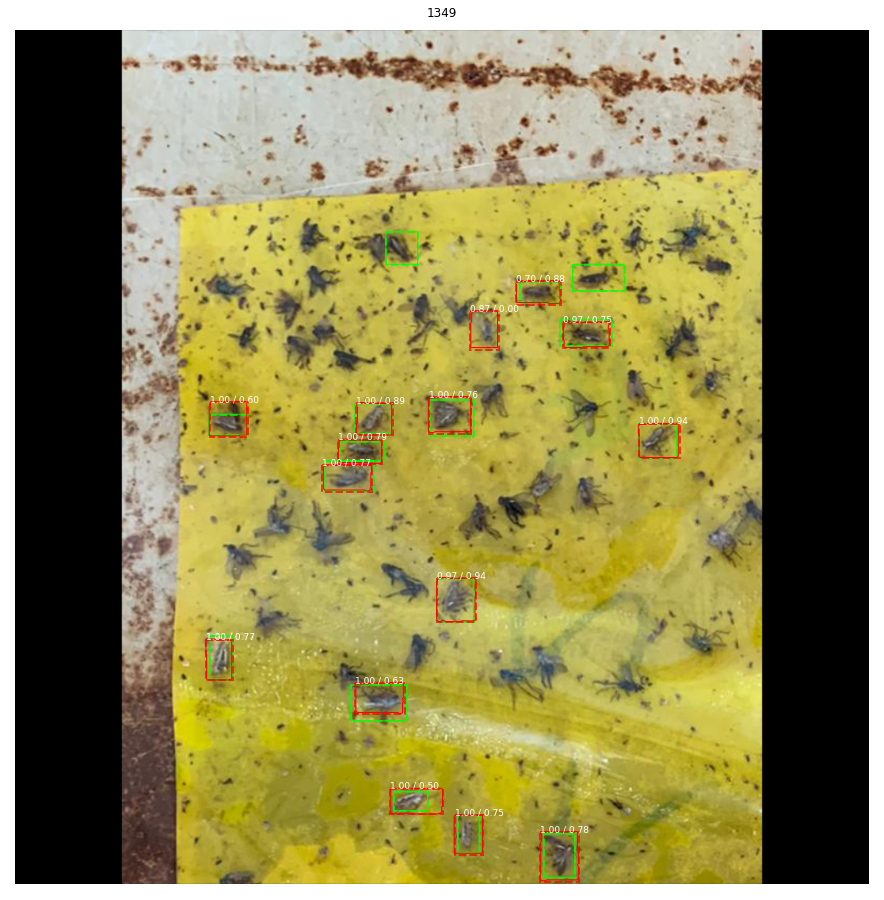

image_id:  878


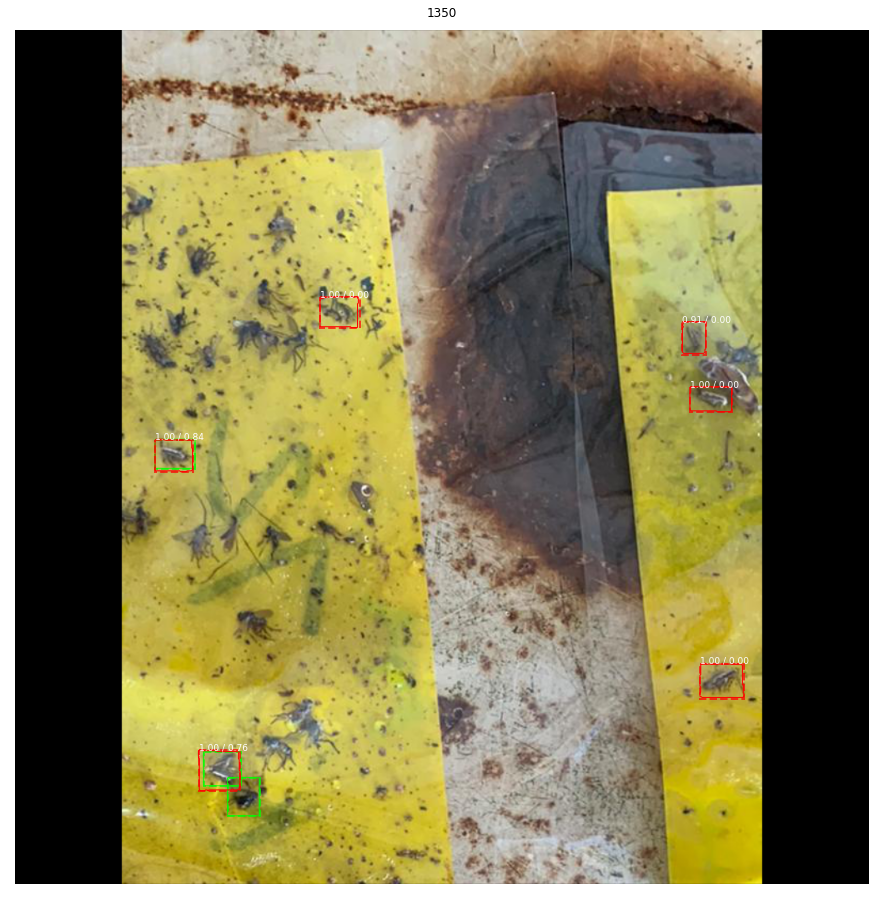

image_id:  764


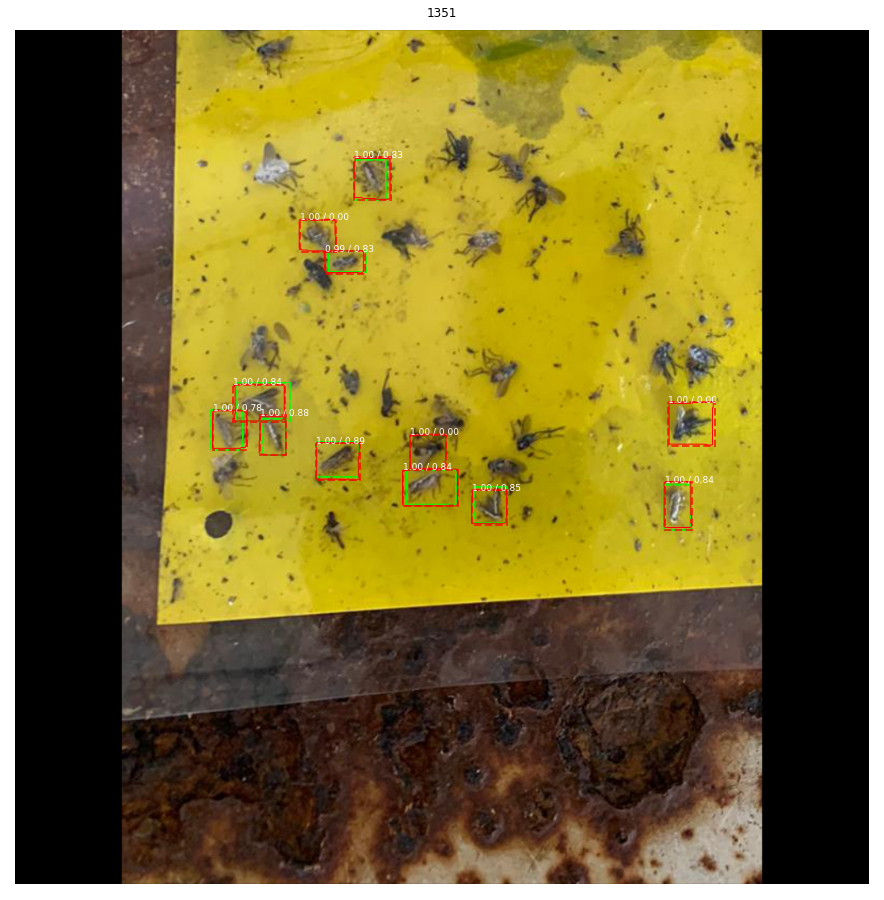

image_id:  733


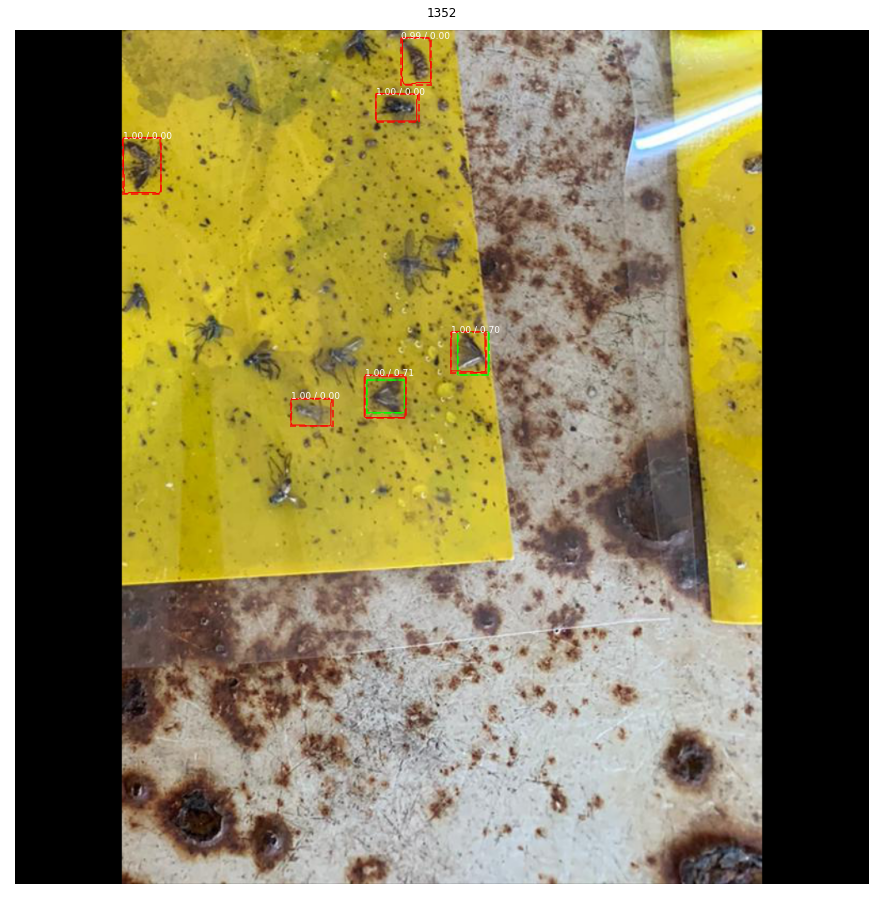

GTs: 30
Num of predictions: 39
[277, 278, 279, 280]
image_id:  734

*** No instances to display *** 



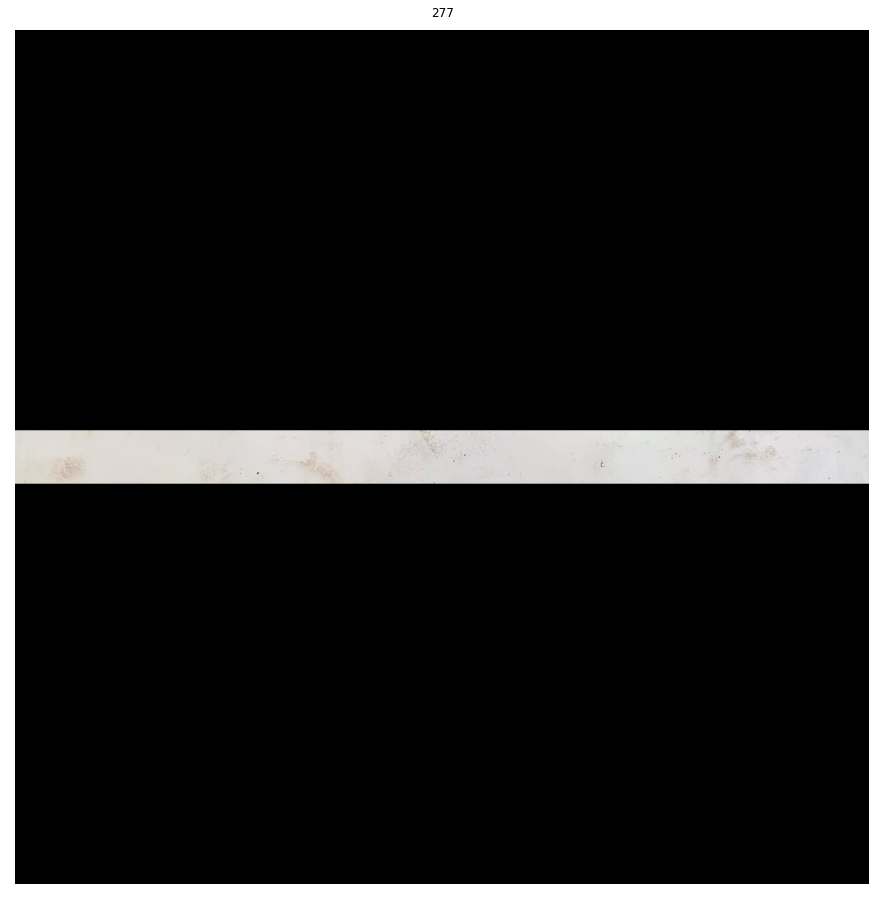

image_id:  812

*** No instances to display *** 



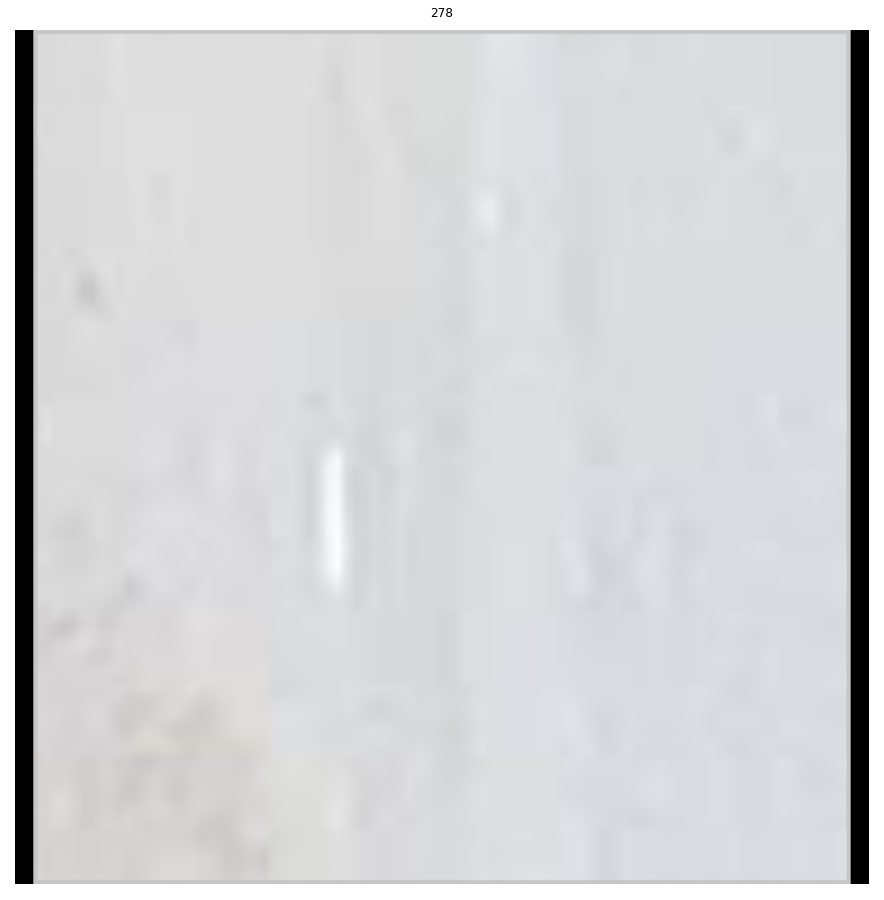

image_id:  535


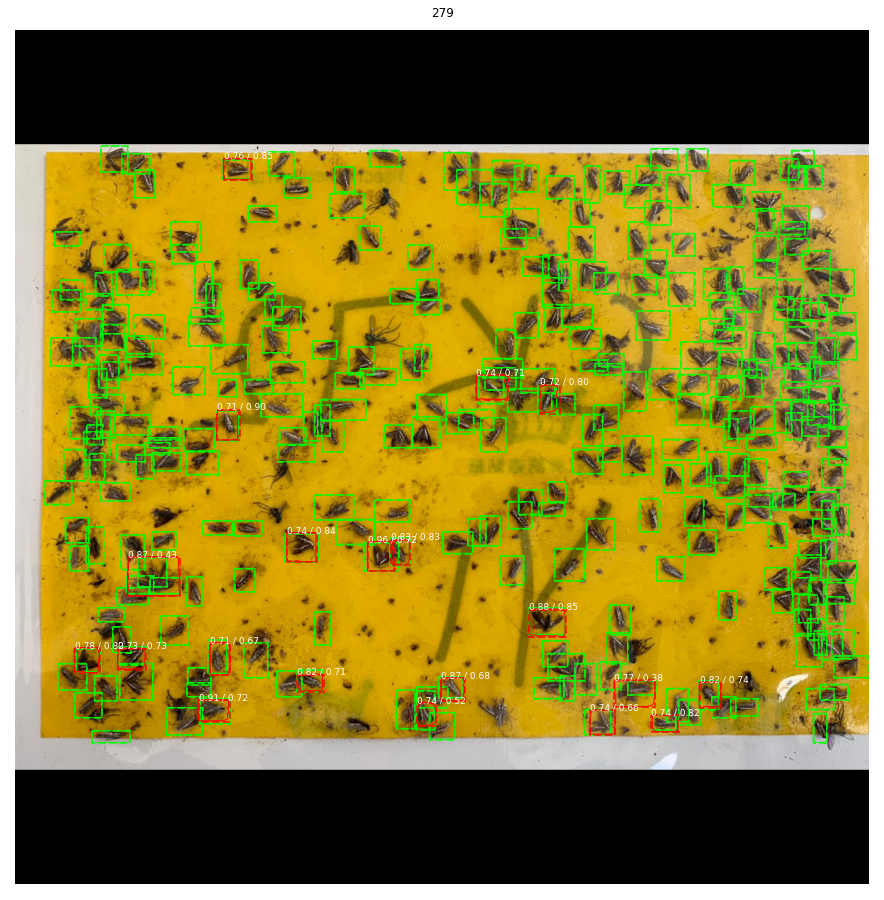

image_id:  480

*** No instances to display *** 



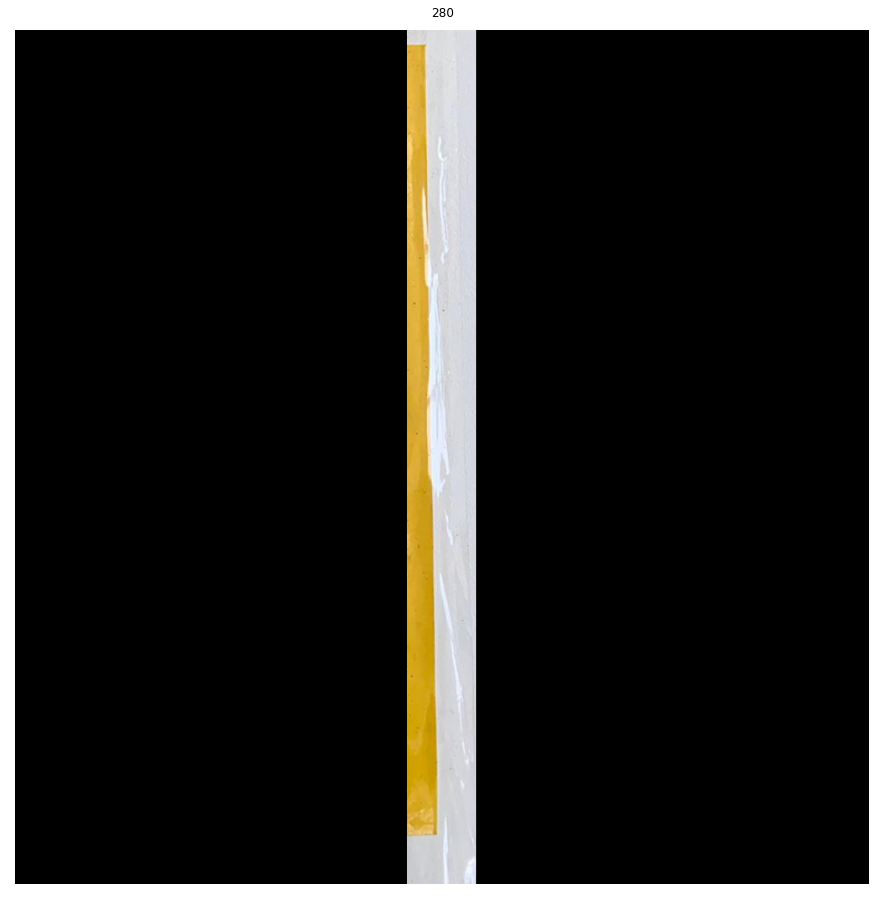

GTs: 316
Num of predictions: 20
[333, 334, 335, 336]
image_id:  543


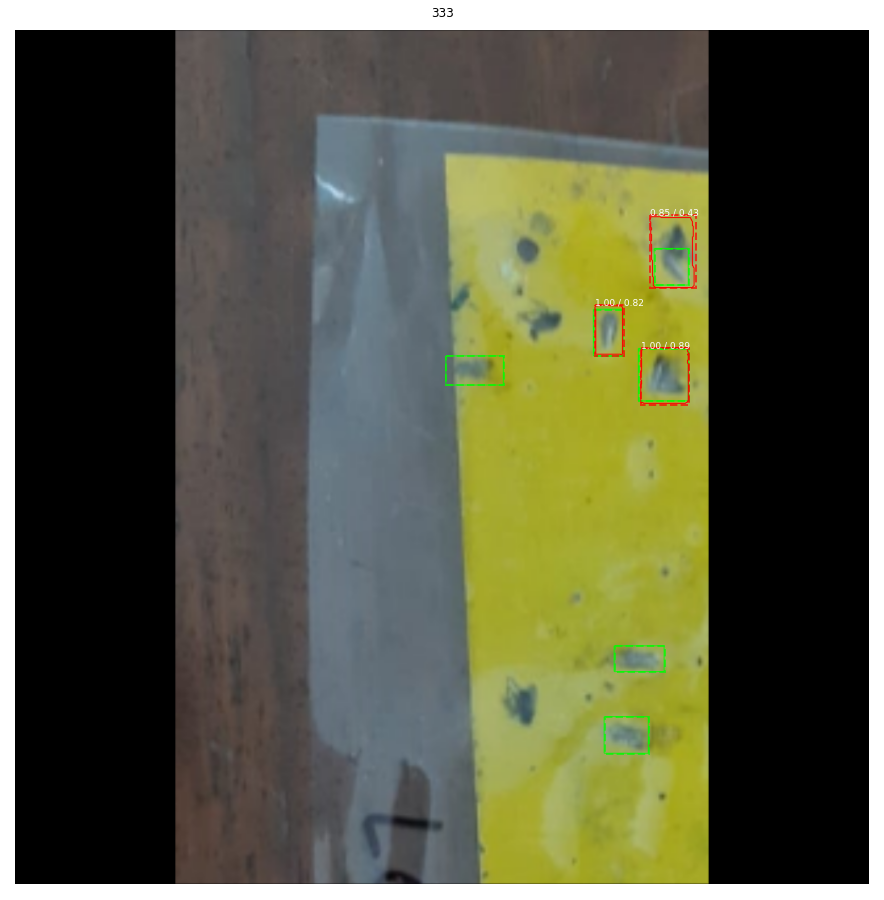

image_id:  192


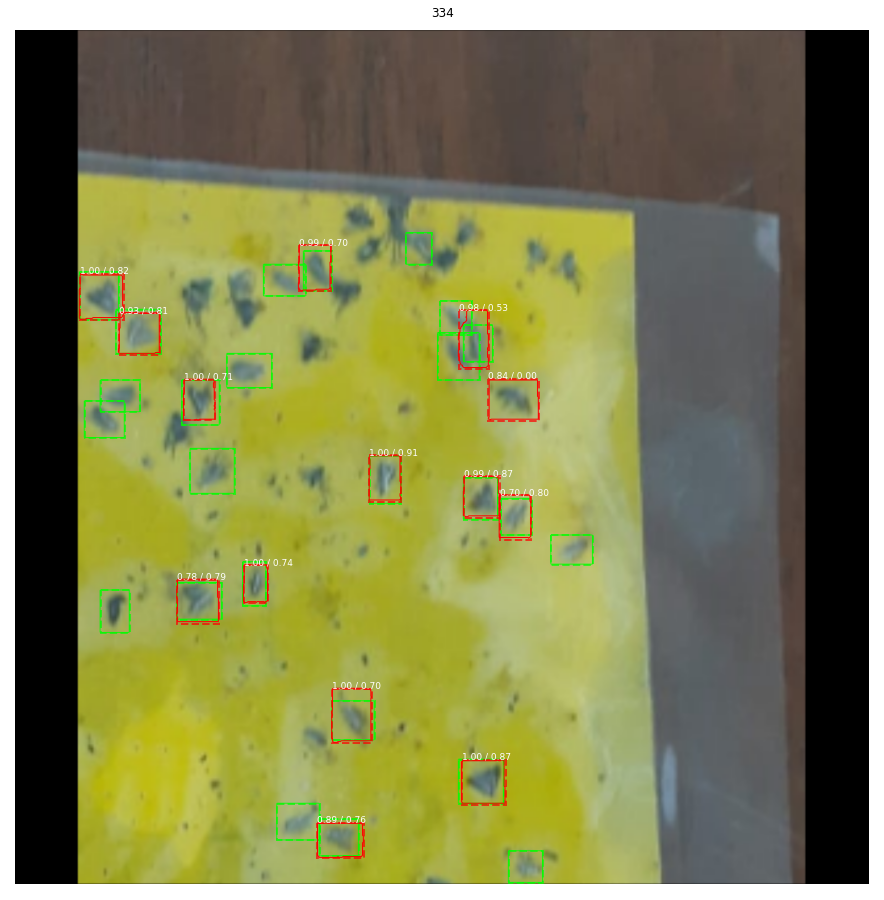

image_id:  175


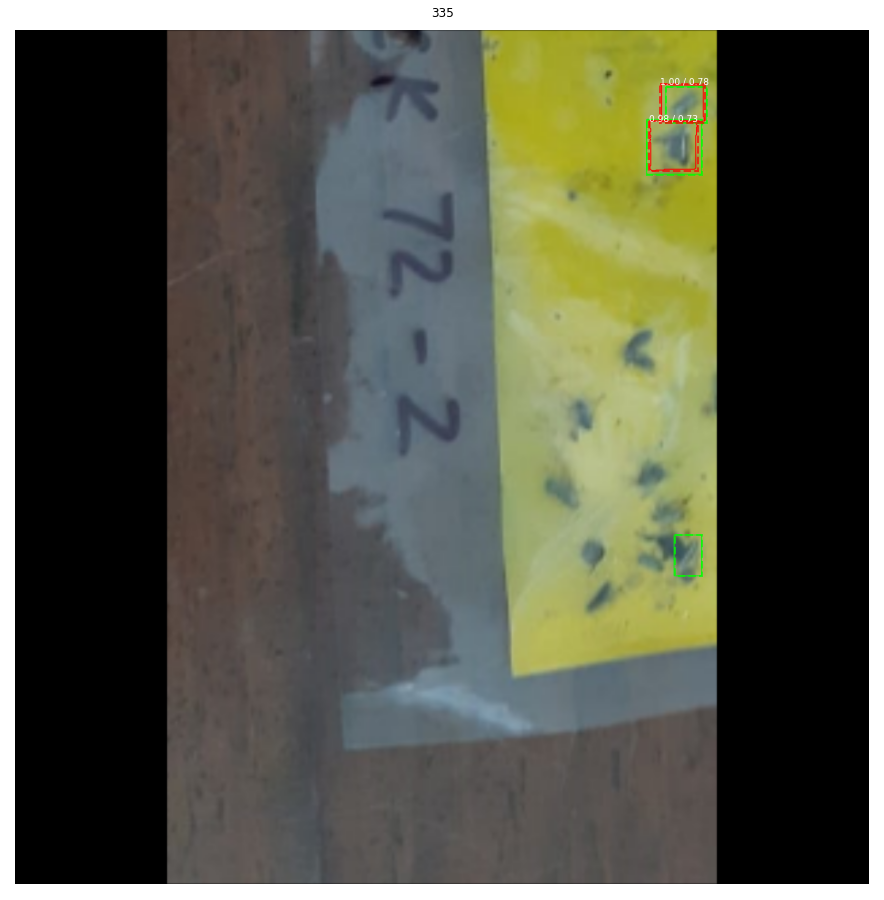

image_id:  445


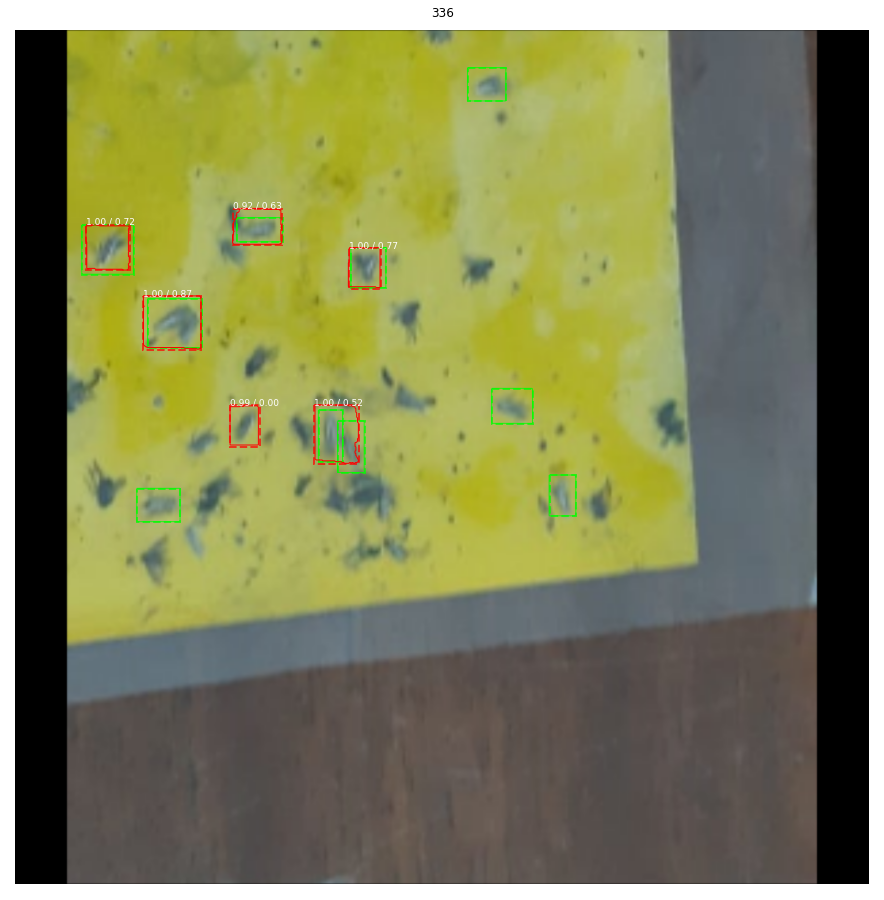

GTs: 44
Num of predictions: 25
[1025, 1026, 1027, 1028]
image_id:  217

*** No instances to display *** 



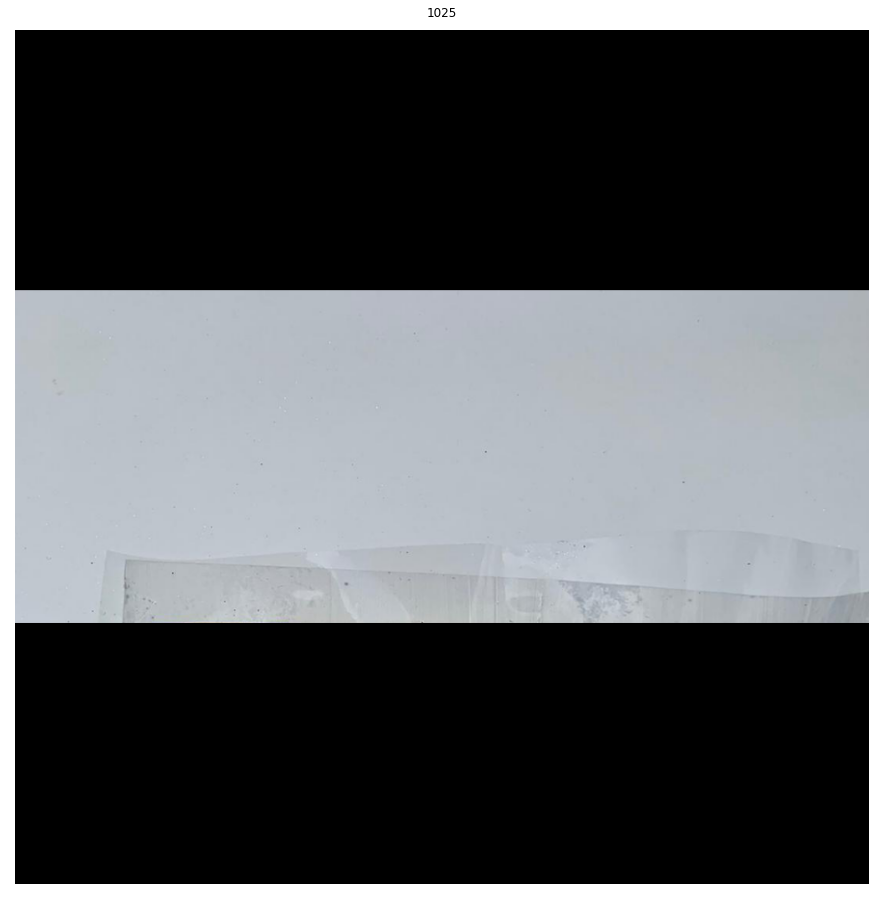

image_id:  194

*** No instances to display *** 



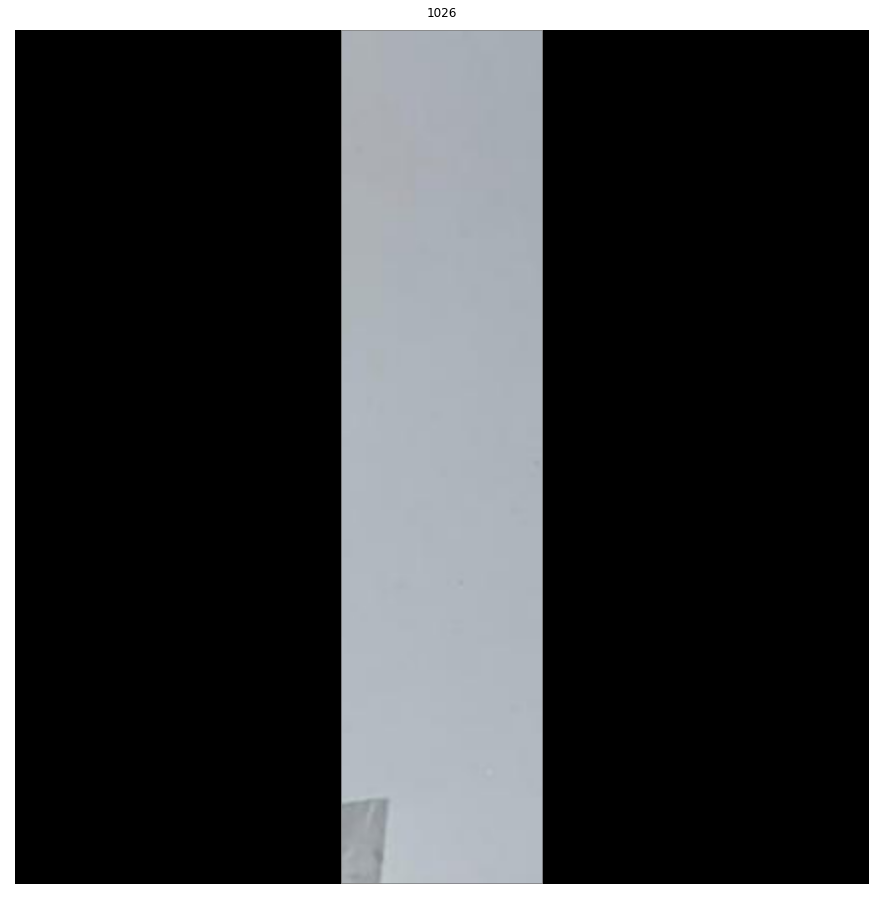

image_id:  861


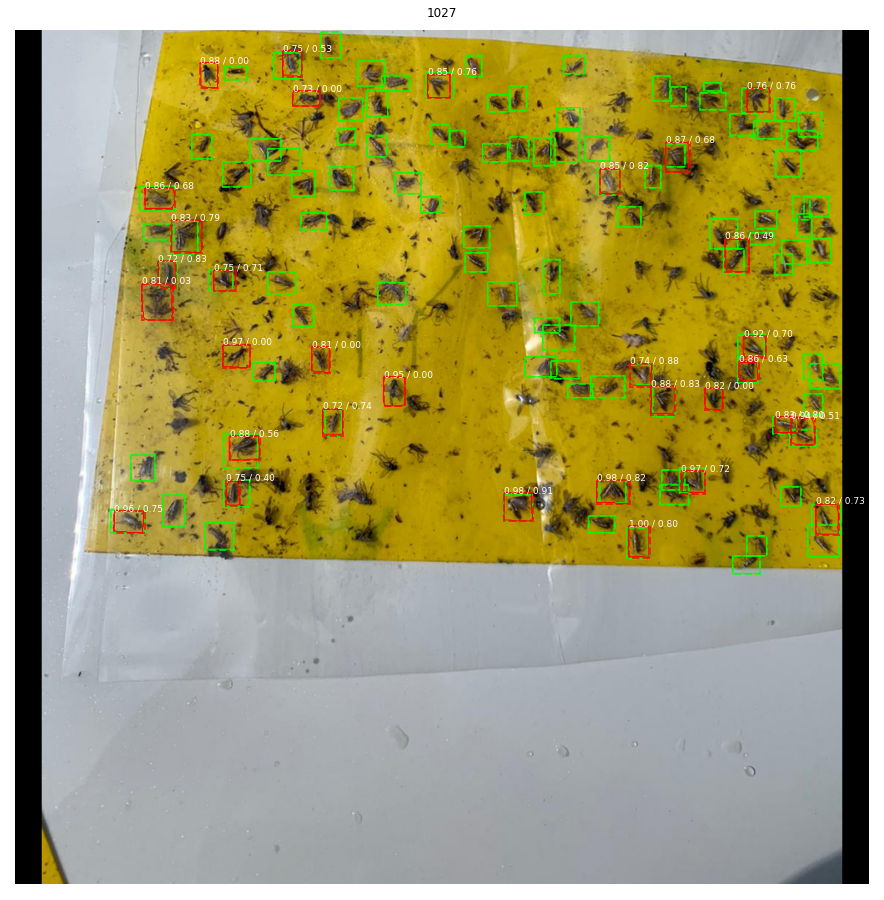

image_id:  186

*** No instances to display *** 



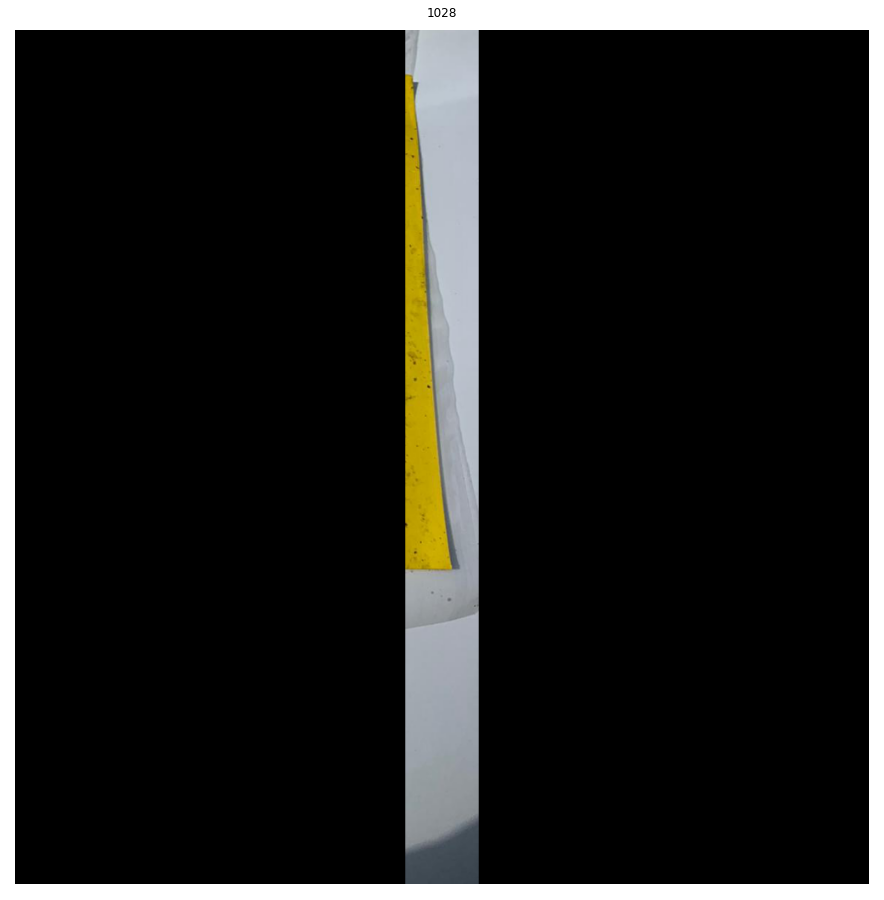

GTs: 105
Num of predictions: 32
[1153, 1154, 1155, 1156]
image_id:  847

*** No instances to display *** 



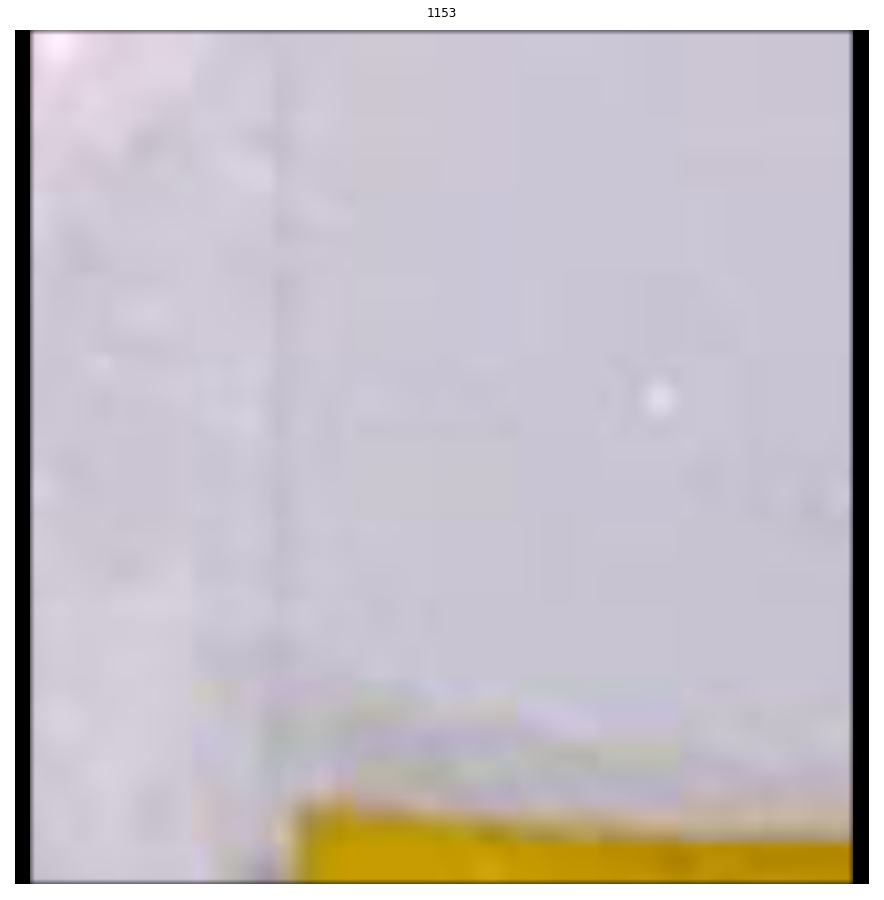

image_id:  312

*** No instances to display *** 



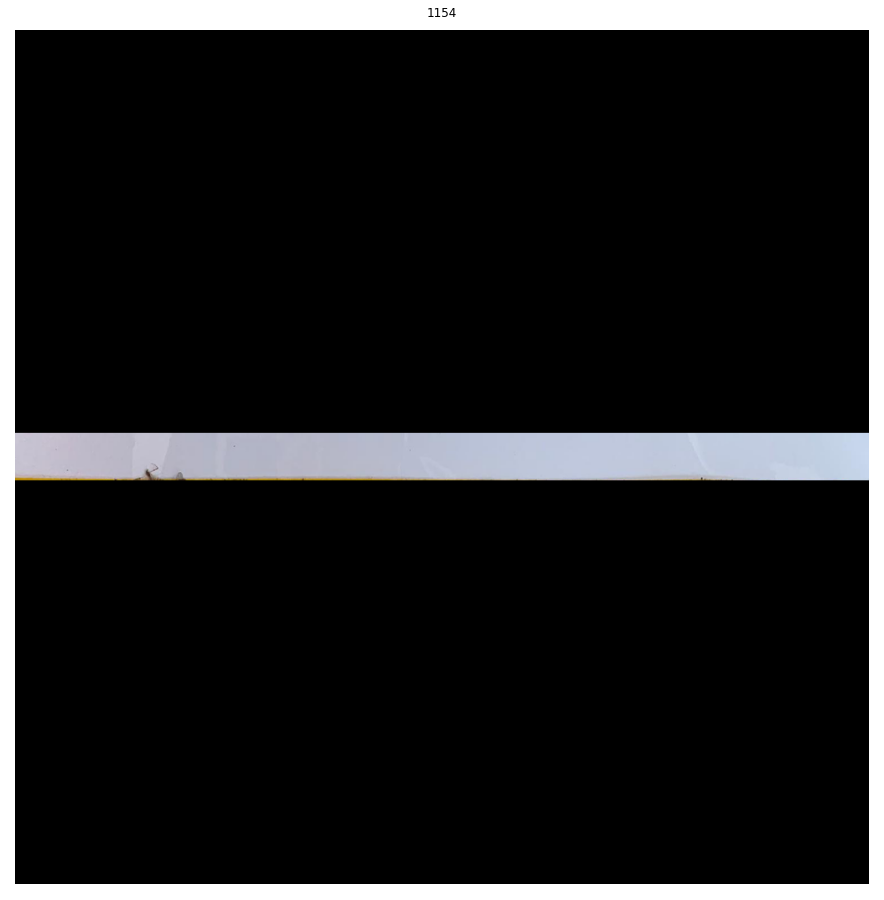

image_id:  723

*** No instances to display *** 



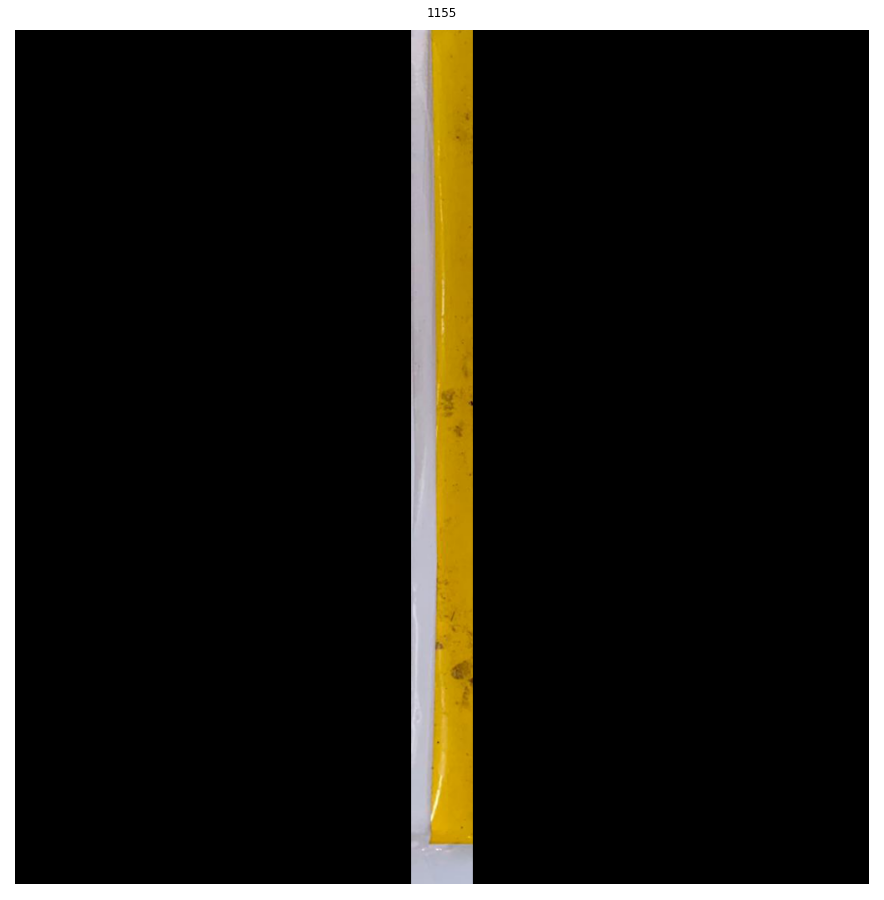

image_id:  768


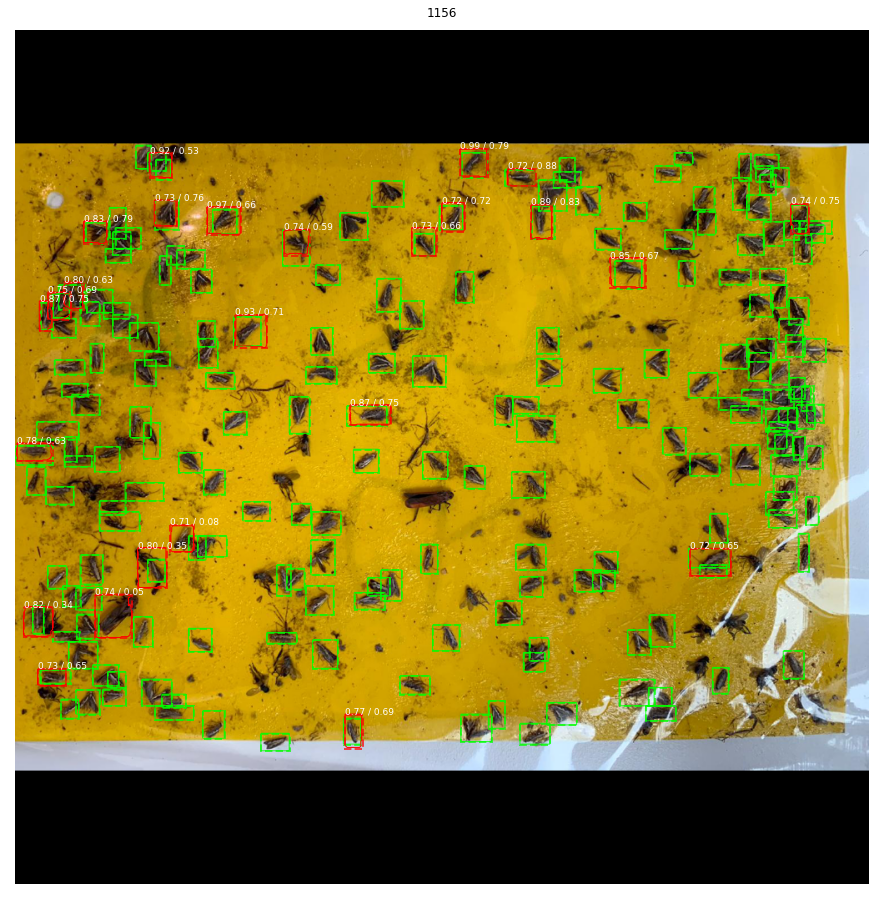

GTs: 205
Num of predictions: 25
[1717, 1718, 1719, 1720]
image_id:  519


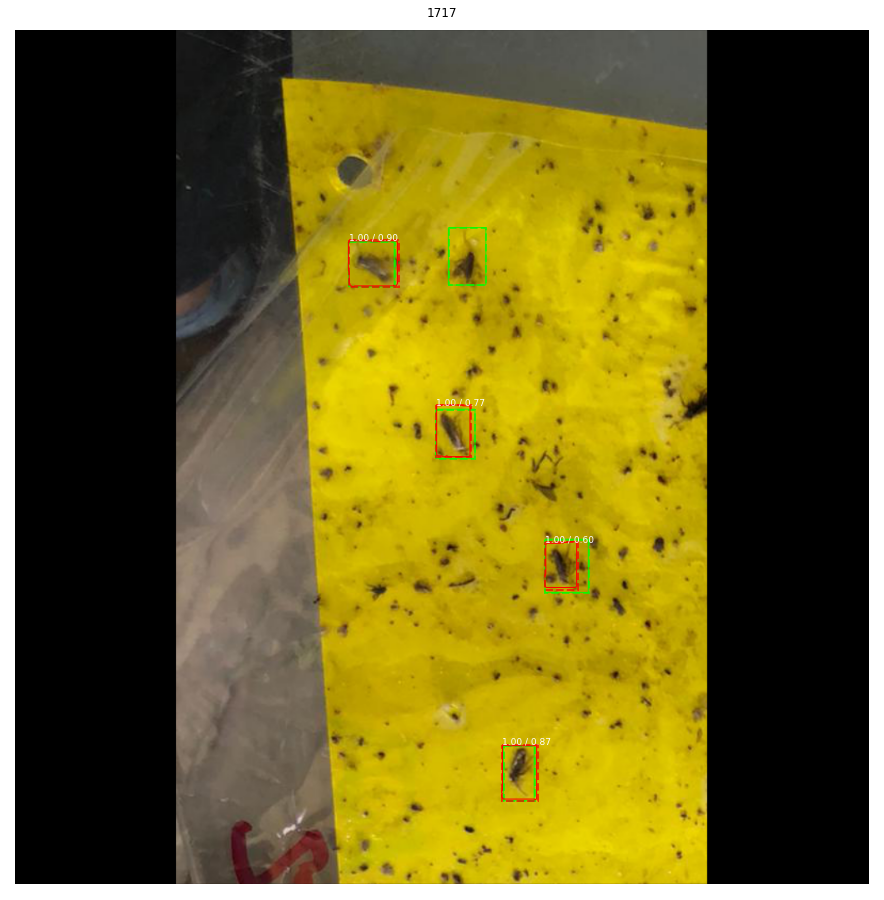

image_id:  466


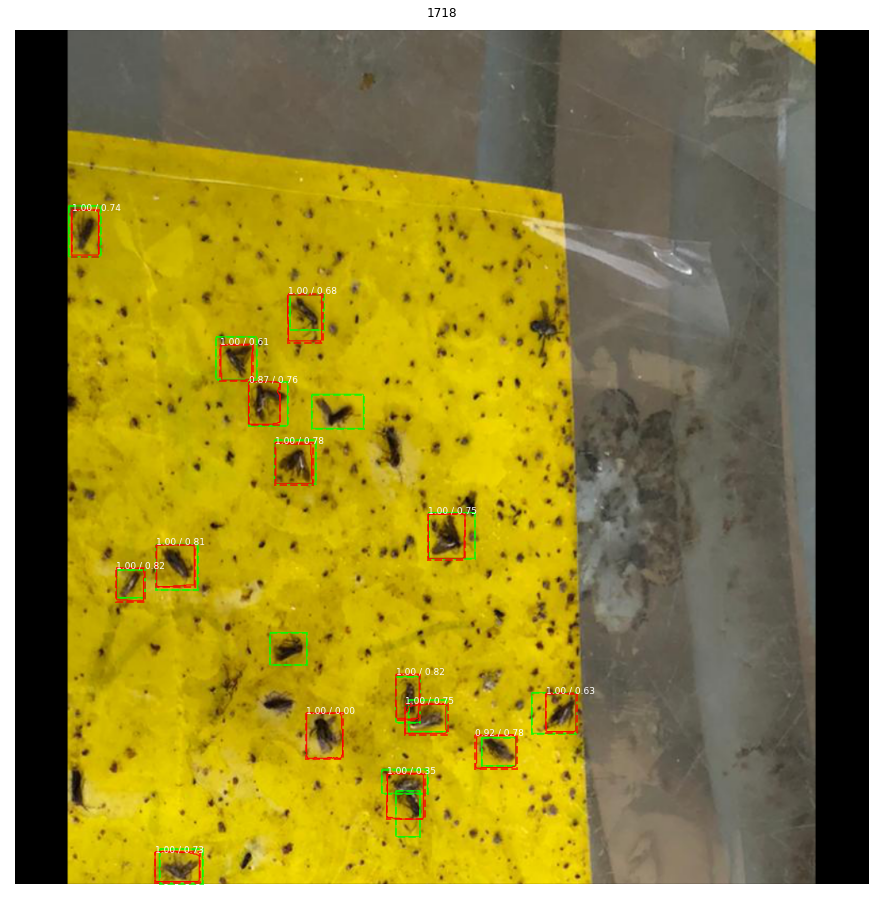

image_id:  875


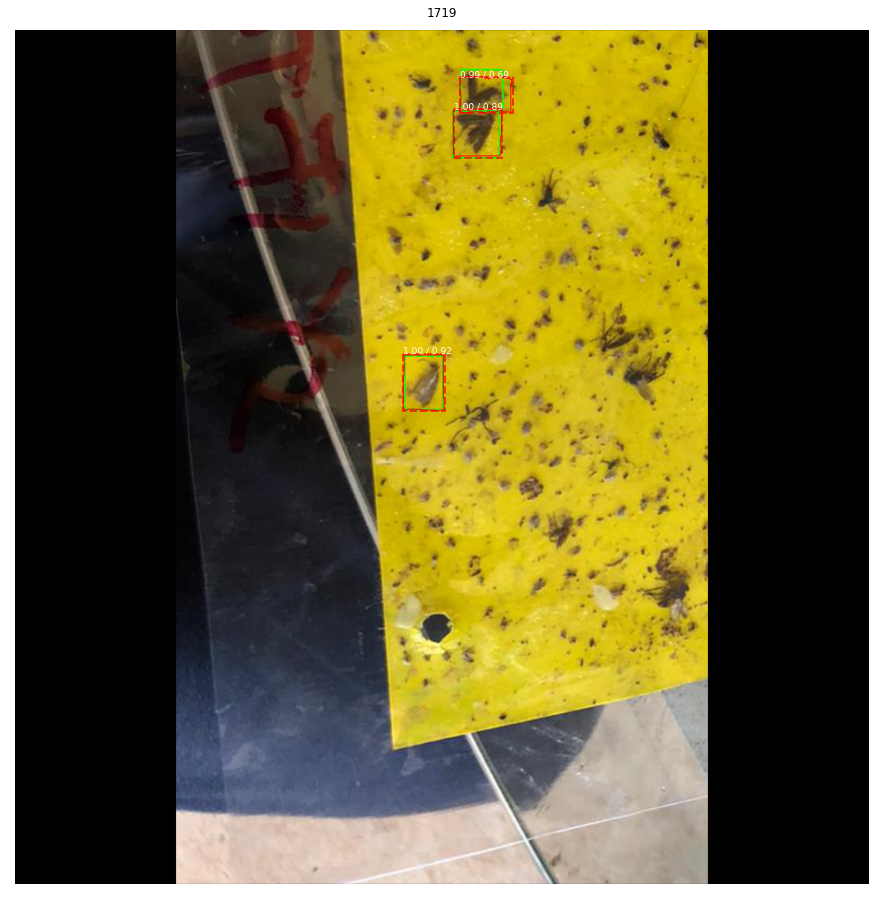

image_id:  72


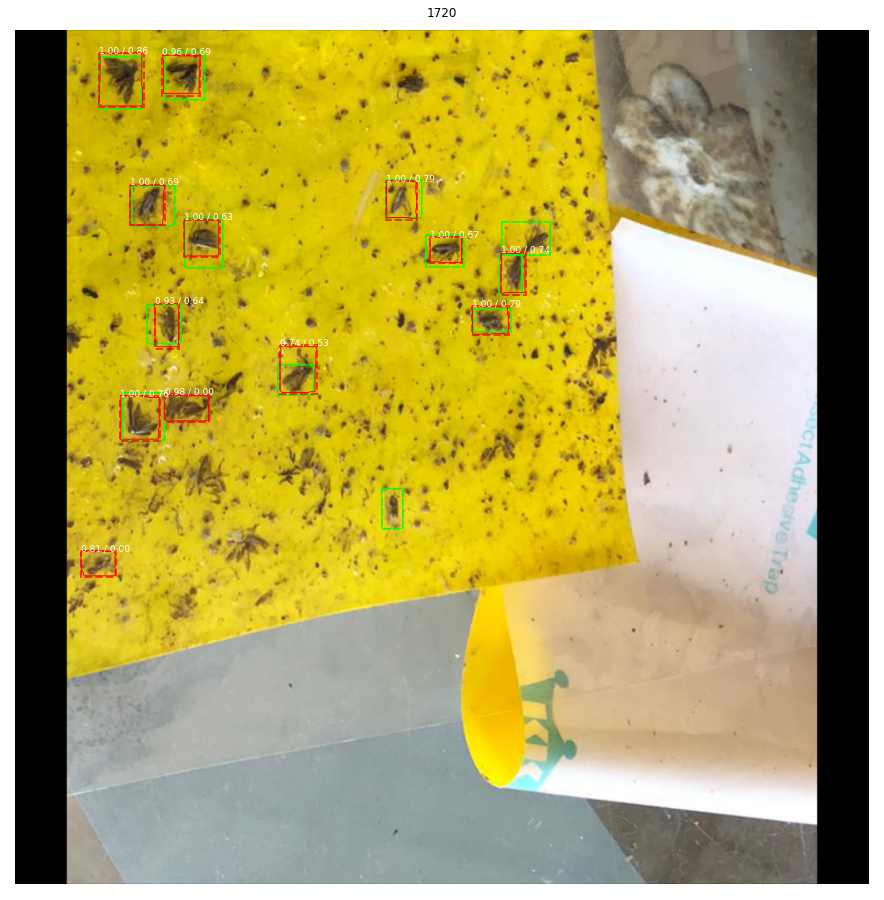

GTs: 38
Num of predictions: 35
[1969, 1970, 1971, 1972]
image_id:  701

*** No instances to display *** 



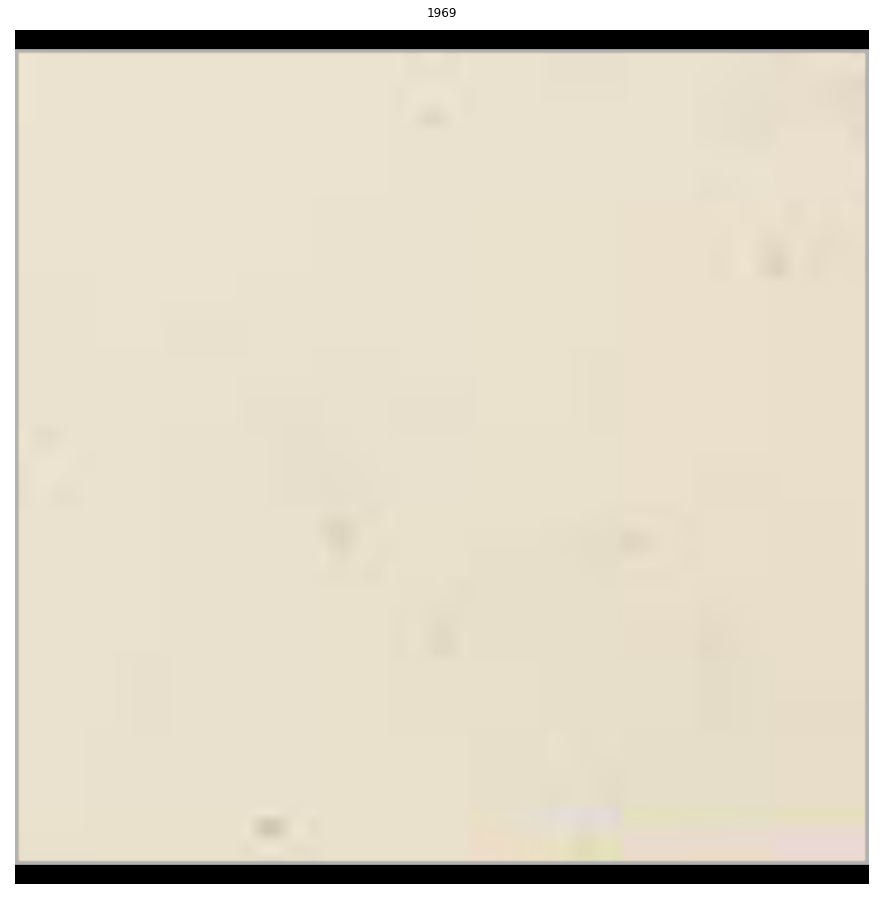

image_id:  35

*** No instances to display *** 



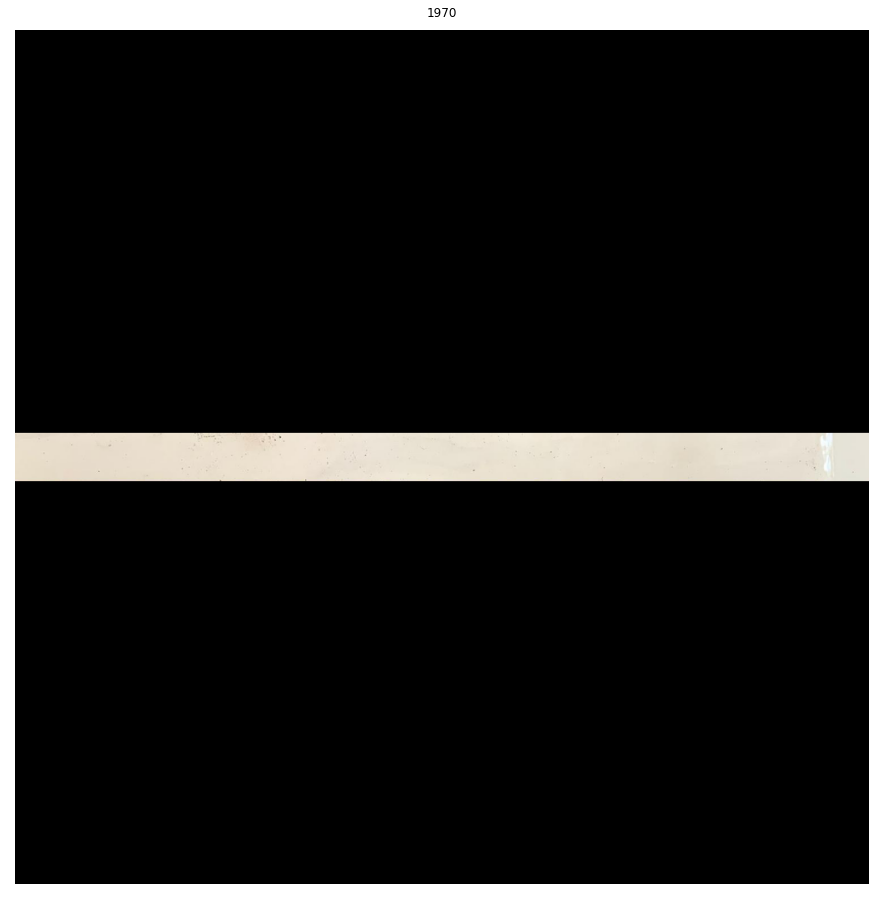

image_id:  111

*** No instances to display *** 



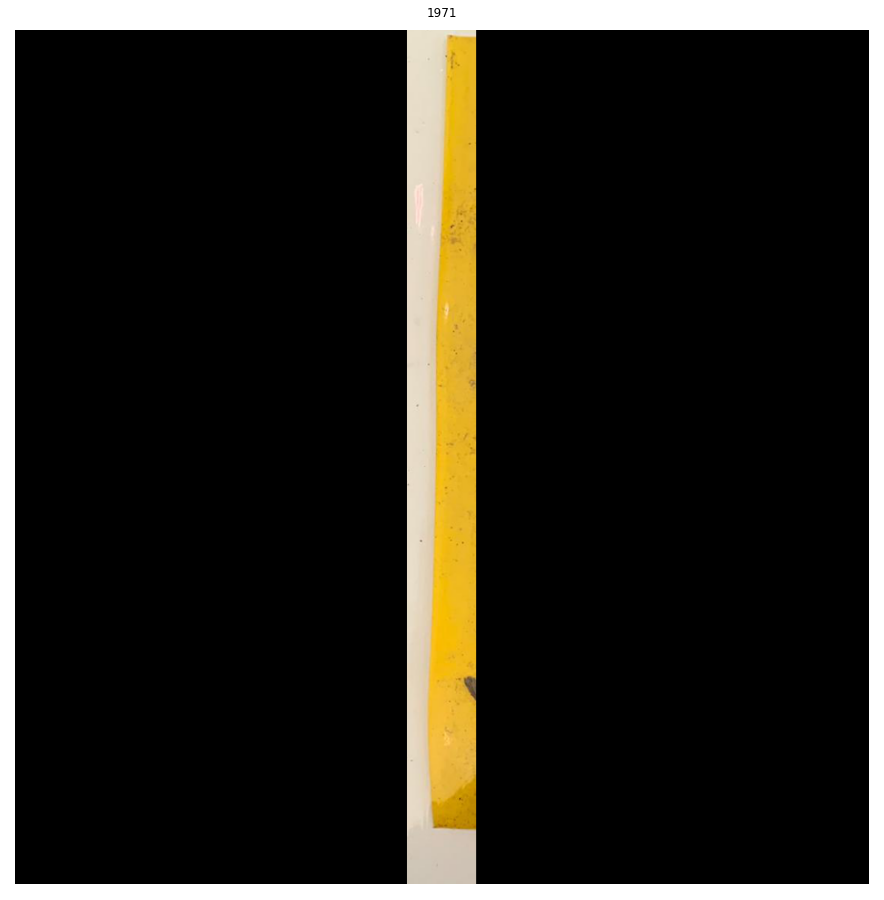

image_id:  381


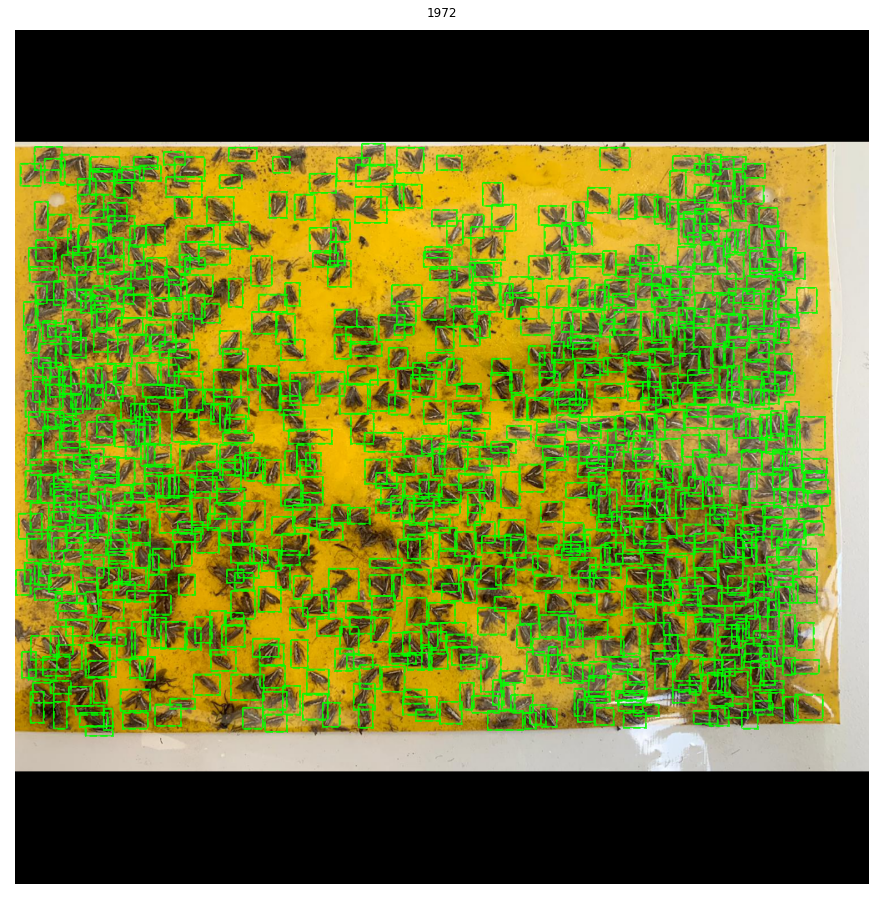

GTs: 868
Num of predictions: 0


In [ ]:
for group in image_ids_to_view:
  #print(group)

  group_gt_match = np.empty([0], int)
  group_pred_match = np.empty([0], int)

  FP_no_DBM = 0

  count_group_gt_bbox = 0
  count_group_pred_bbox = 0

  for info_id in group:
    #print(info_id)
    image_id = id_dict.get(info_id)
    #print(image_id)
    image, image_meta, gt_class_id, gt_bbox, gt_mask = model.load_image_gt(valid_dataset, DBM_config, image_id, use_mini_mask=False)

    #print("===================================================================================================================")
    print("image_id: ", image_id)
    info = valid_dataset.image_info[image_id]
    results = DBM_model.detect([image], verbose=0)
    r = results[0]

    count_group_gt_bbox += len(gt_bbox)
    count_group_pred_bbox += len(r['rois'])

    if len(gt_bbox) != 0:
      
      visualize.display_differences(image, gt_bbox, gt_class_id, gt_mask, 
                                    r['rois'], r['class_ids'], r['scores'], r['masks'], 
                                    valid_dataset.class_names, title=str(info["id"]), 
                                    ax=None, show_mask=False, show_box=True, 
                                    iou_threshold=0.5, score_threshold=0.5, save_image = False, 
                                    filename = (str(int(group[3]/4)) + " (" + str(group.index(info_id) + 1) + ")")) #uncomment above cell if save_image = True
      
      gt_match, pred_match, overlaps = utils.compute_matches(gt_bbox, gt_class_id, gt_mask, 
                                                            r['rois'], r['class_ids'], r['scores'], r['masks'], 
                                                            iou_threshold=0.5)

      #print(gt_match)
      #print(pred_match)

      for num in gt_match:
        if num > -1:
          while num in group_gt_match:
            num += 1
        group_gt_match = np.append(group_gt_match, num)

      for num in pred_match:
        if num > -1:
          while num in group_pred_match:
            num += 1
        group_pred_match = np.append(group_pred_match, num)

      #print(group_gt_match)
      #print(group_pred_match)

      TP = np.sum(pred_match > -1)
      #print("TP: ", TP)

      FP = np.sum(pred_match == -1)
      #print("FP: ", FP)

      FN = len(gt_match) - np.sum(pred_match > -1)
      #print("FN: ", FN)

    else:
      #print("No DBMs present in image %s" % str(image_id))
      #total_images_noGT += 1
      #print("image_id: ", image_id)

      
      visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                  valid_dataset.class_names, r['scores'], 
                                  title=str(info["id"]), show_mask = False, save_image = False, 
                                  filename = (str(int(group[3]/4)) + " (" + str(group.index(info_id) + 1) + ")"))
      

      #print("FP no DBM: ", len(r['rois']))
      #total_FP_no_DBM += FP_no_DBM

      for x in range(0, len(r['rois'])):
        group_pred_match = np.append(group_pred_match, -1)

  #print(group_gt_bbox)
  #print(len(group_gt_bbox))
  if len(group_gt_match) != 0:

    '''
    gt_match, pred_match, overlaps =\
        utils.compute_matches(group_gt_bbox, group_gt_class_id, group_gt_mask, group_rois, group_ids, group_scores, group_masks, iou_threshold=0.5)

    print(gt_match)
    print(pred_match)

    AP, precisions, recalls, overlaps =\
        utils.compute_ap(group_gt_bbox, group_gt_class_id, group_gt_mask, group_rois, group_ids, group_scores, group_masks, iou_threshold=0.5)
    '''
    #print(group_gt_match)
    #print(group_pred_match)

    AP, precisions, recalls = compute_ap(group_gt_match, group_pred_match)

    #APs.append(AP)
    #print("AP: ", AP)
    #print("APs: ", APs)
    #print("precisions: ", precisions)
    #print("recalls: ", recalls)
    #print("precision value: ", precisions[-2])
    #mPrecision.append(precisions[-2])
    #print("recall value: ", recalls[-2])
    #mRecall.append(recalls[-2])

    #recall, positive_ids = utils.compute_recall(group_rois, group_gt_mask, 0.5)
    #print("recall value: ", recall)
    #mRecall.append(recall)

    #print("mAP: ", np.mean(APs))
    #print("Mean Precision: ", np.mean(mPrecision))
    #print("mAR: ", np.mean(mRecall))

    #FPs += FP_no_DBM
    
    TP = np.sum(group_pred_match > -1)
    FP = np.sum(group_pred_match == -1)
    FN = len(group_gt_match) - np.sum(group_pred_match > -1)

    print("GTs:", count_group_gt_bbox)
    print("Num of predictions:", count_group_pred_bbox)

  else:
    print("GTs: 0")
    print("Num of predictions:", count_group_pred_bbox)

    #print("FP no DBM for all 4 images: ", FP_no_DBM)
    #total_FP_no_DBM += FP_no_DBM
    #total_images_noGT += 1